<div class="alert alert-block alert-info">
<br />

## Credit Card Fraud Detection Using Machine Learning Algorithms and Labeled Data ##
### Term Paper for IRFA Program “Data Science Software” Course ###
### Submission By: Sarbjit GILL, Saloniba RATHOD and Leticia MARRARA ###
### January 9, 2023 ### 
</br >
</div>

<div class="alert alert-block alert-warning">
<p>
TABLE OF CONTENTS<br />
    <br />
TASK 0: INSTALLATION AND IMPORTATION OF LIBRARIES AND COMMANDS<br />
TASK 1: DATA IMPORTATION AND TRANSFORMATION<br />
TASK 2: EXPLORATORY DATA ANALYSIS<br />
TASK 3: DATA PRE-PROCESSING<br />
TASK 4: CHAMPION MODEL: BASELINE RESULTS + TUNING<br />
TASK 5: CHALLENGER MODELS: BASELINE RESULTS + TUNING<br /> 
TASK 6: FINAL MODEL SELECTION<br /> 
TASK 7: AN INVESTIGATION INTO POOR PERFORMANCE OF TWO MODELS<br /> 
</p>
    </div>

**TASK 0: INSTALLATION AND IMPORTATION OF LIBRARIES AND COMMANDS**
<div class="alert alert-block alert-warning">

In [5]:
pip install pandas-profiling

Note: you may need to restart the kernel to use updated packages.


In [6]:
conda install -c conda-forge matplotlib

Retrieving notices: ...working... done
Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [7]:
%matplotlib inline

In [8]:
pip install category_encoders

Note: you may need to restart the kernel to use updated packages.


In [9]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install Boruta

Note: you may need to restart the kernel to use updated packages.


In [36]:
# Importing libraries
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport 
from datetime import datetime
from tqdm import tqdm

# Visualization libraries
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter, PercentFormatter
import seaborn as sns
import plotly.express as px

# Encoding libraries
from category_encoders.target_encoder import TargetEncoder
from category_encoders.wrapper import NestedCVWrapper
from category_encoders.one_hot import OneHotEncoder

# Data pre-processing libraries
from scipy.stats import shapiro
from geopy.distance import geodesic
from collections import Counter

# Data Imbalance Library
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek, SMOTEENN

# Machine learning and model selection libraries
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from boruta import BorutaPy
from sklearn.feature_selection import mutual_info_classif, SelectFromModel

# Metrics
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score, accuracy_score, roc_curve, auc, roc_auc_score, RocCurveDisplay, PrecisionRecallDisplay, precision_recall_curve

<div class="alert alert-block alert-warning">

**TASK 1: DATA IMPORTATION AND TRANSFORMATION**

<div class="alert alert-block alert-warning">

In [13]:
# Importing training set data
training_set = pd.read_csv('/Users/Sarb/Documents/Sorbonne/Python for Optimization and Finance/Data Science Project/Datasets/fraudTrain.csv') 
training_set.head(10)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0
5,5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,Jennifer,Conner,F,4655 David Island,...,40.3750,-75.2045,2158,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0
6,6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,Kelsey,Richards,F,889 Sarah Station Suite 624,...,37.9931,-100.9893,2691,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0
7,7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,Steven,Williams,M,231 Flores Pass Suite 720,...,38.8432,-78.6003,6018,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0
8,8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,Heather,Chase,F,6888 Hicks Stream Suite 954,...,40.3359,-79.6607,1472,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0
9,9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,...,36.5220,-87.3490,151785,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0


In [14]:
# Checking how variables are entered: column names, missing values, and data types

training_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

---


<p>
Observations:
<br />
1) We can delete the first column as it is merely a unique identifier for each row.<br />
2) We can change a few column names for readability.<br />
3) We have no missing values. <br />
4) Three columns can be changed to datetime: trans_date_trans_time, dob, and unix_time. <br />
5) A number of columns should be changed to categorical: credit card number, merchant, category, gender, street & apartment number, city, state, zip code, job, and is_fraud, and more. <br />
6) New variables can be created to aid our analysis. <br />
</p>


---

In [15]:
# Dropping the first column and sorting values
training_set.drop('Unnamed: 0', axis=1, inplace=True)
training_set.head(10)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0
5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,Jennifer,Conner,F,4655 David Island,Dublin,...,40.3750,-75.2045,2158,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0
6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,Kelsey,Richards,F,889 Sarah Station Suite 624,Holcomb,...,37.9931,-100.9893,2691,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0
7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,Steven,Williams,M,231 Flores Pass Suite 720,Edinburg,...,38.8432,-78.6003,6018,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0
8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,Heather,Chase,F,6888 Hicks Stream Suite 954,Manor,...,40.3359,-79.6607,1472,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0
9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,Clarksville,...,36.5220,-87.3490,151785,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0


In [16]:
# Changing names of a few columns for readability:

training_set.rename(columns={"trans_date_trans_time":"transaction_time",
                         "cc_num":"credit_card_number",
                         "amt":"amount(usd)",
                         "first":"first_name",
                         "last":"last_name",
                         "street":"street_apt_number",
                         "zip":"zip_code",
                         "lat":"latitude_card_holder",
                         "long":"longitude_card_holder",
                         "city_pop":"city_population",
                         "dob":"date_of_birth",
                         "trans_num":"transaction_id",
                         "merch_lat":"latitude_merchant",
                         "merch_long":"longitude_merchant"}, inplace=True)
training_set.head(10)

,transaction_time,credit_card_number,merchant,category,amount(usd),first_name,last_name,gender,street_apt_number,city,...,latitude_card_holder,longitude_card_holder,city_population,job,date_of_birth,transaction_id,unix_time,latitude_merchant,longitude_merchant,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0
5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,Jennifer,Conner,F,4655 David Island,Dublin,...,40.3750,-75.2045,2158,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0
6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,Kelsey,Richards,F,889 Sarah Station Suite 624,Holcomb,...,37.9931,-100.9893,2691,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0
7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,Steven,Williams,M,231 Flores Pass Suite 720,Edinburg,...,38.8432,-78.6003,6018,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0
8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,Heather,Chase,F,6888 Hicks Stream Suite 954,Manor,...,40.3359,-79.6607,1472,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0
9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,Clarksville,...,36.5220,-87.3490,151785,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0


In [17]:
# Converting transaction time and dob to datetime format

training_set["transaction_time"] = pd.to_datetime(training_set["transaction_time"], infer_datetime_format=True)
training_set["date_of_birth"] = pd.to_datetime(training_set["date_of_birth"], infer_datetime_format=True)

# Sorting data by 'transaction_time' to create the 'velocity' variable below
training_set = training_set.sort_values(by='transaction_time', ascending=True)
training_set = training_set.reset_index()
training_set = training_set.iloc[: , 0:]
training_set.head(10)

,index,transaction_time,credit_card_number,merchant,category,amount(usd),first_name,last_name,gender,street_apt_number,...,latitude_card_holder,longitude_card_holder,city_population,job,date_of_birth,transaction_id,unix_time,latitude_merchant,longitude_merchant,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0
5,5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,Jennifer,Conner,F,4655 David Island,...,40.3750,-75.2045,2158,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0
6,6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,Kelsey,Richards,F,889 Sarah Station Suite 624,...,37.9931,-100.9893,2691,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0
7,7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,Steven,Williams,M,231 Flores Pass Suite 720,...,38.8432,-78.6003,6018,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0
8,8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,Heather,Chase,F,6888 Hicks Stream Suite 954,...,40.3359,-79.6607,1472,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0
9,9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,...,36.5220,-87.3490,151785,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0


In [18]:
# Adding 7 new columns

# Adding column "hour of the day"
training_set['hour_of_day'] = training_set.transaction_time.dt.hour

# Adding categorical version of column "hour of the day"
training_set['hour_of_day_cat'] = training_set['hour_of_day'].astype(str)
training_set['hour_of_day_cat'].replace(['0', '1', '2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23'],['A', 'B', 'C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X'], inplace=True)

# Adding "month" column
training_set['month'] = training_set.transaction_time.dt.month

# Adding categorical version of column "hour of the day"
training_set['month_cat'] = training_set['month'].astype(str)
training_set['month_cat'].replace(['1','2','3','4','5','6','7','8','9','10','11','12'],['A','B','C','D','E','F','G','H','I','J','K','L'], inplace=True)

# Adding "velocity" column whose values indicate time elapsed between two transactions, down to seconds
training_set['velocity'] = training_set.groupby("credit_card_number").transaction_time.diff().dt.total_seconds()
training_set['velocity'] = training_set['velocity'].astype(float)
training_set['velocity'] = training_set['velocity'].fillna(0)

# Adding an "age" column
training_set['age'] = training_set.transaction_time.dt.year - training_set.date_of_birth.dt.year
training_set['age'] = training_set['age']

# Adding a "distance_from_home" column to see how far a transaction took place from home: cardholder's residence vs merchant location
training_set['distance_from_home'] = training_set.apply(
    (lambda row: geodesic(
        (row['latitude_card_holder'], row['longitude_card_holder']),
        (row['latitude_merchant'], row['longitude_merchant'])
    ).miles),
    axis=1
)

# Adding "full_name" as a column and dropping "first_name" and "last_name"
training_set["full_name"]=(training_set["first_name"] +  training_set["last_name"])

# Removing newly created index column after sorting values by 'transaction_time'
training_set = training_set.iloc[: , 1:]
training_set

,transaction_time,credit_card_number,merchant,category,amount(usd),first_name,last_name,gender,street_apt_number,city,...,longitude_merchant,is_fraud,hour_of_day,hour_of_day_cat,month,month_cat,velocity,age,distance_from_home,full_name
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,-82.048315,0,0,A,1,A,0.0,31,48.947783,JenniferBanks
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,-118.186462,0,0,A,1,A,0.0,41,18.775736,StephanieGill
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,-112.154481,0,0,A,1,A,0.0,57,67.172035,EdwardSanchez
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,-112.561071,0,0,A,1,A,0.0,52,59.455974,JeremyWhite
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,-78.632459,0,0,A,1,A,0.0,33,48.282030,TylerGarcia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1296670,2020-06-21 12:12:08,30263540414123,fraud_Reichel Inc,entertainment,15.56,Erik,Patterson,M,162 Jessica Row Apt. 072,Hatch,...,-111.690765,0,12,M,6,F,16781.0,59,74.375904,ErikPatterson
1296671,2020-06-21 12:12:19,6011149206456997,fraud_Abernathy and Sons,food_dining,51.70,Jeffrey,White,M,8617 Holmes Terrace Suite 651,Tuscarora,...,-78.246528,0,12,M,6,F,7962.0,41,46.728470,JeffreyWhite
1296672,2020-06-21 12:12:32,3514865930894695,fraud_Stiedemann Ltd,food_dining,105.93,Christopher,Castaneda,M,1632 Cohen Drive Suite 639,High Rolls Mountain Park,...,-105.130529,0,12,M,6,F,29074.0,53,61.508246,ChristopherCastaneda
1296673,2020-06-21 12:13:36,2720012583106919,"fraud_Reinger, Weissnat and Strosin",food_dining,74.90,Joseph,Murray,M,42933 Ryan Underpass,Manderson,...,-103.241160,0,12,M,6,F,91018.0,40,52.622905,JosephMurray


In [19]:
# Checking columns to drop: those not useful in exploratory analysis and models
training_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 30 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   transaction_time       1296675 non-null  datetime64[ns]
 1   credit_card_number     1296675 non-null  int64         
 2   merchant               1296675 non-null  object        
 3   category               1296675 non-null  object        
 4   amount(usd)            1296675 non-null  float64       
 5   first_name             1296675 non-null  object        
 6   last_name              1296675 non-null  object        
 7   gender                 1296675 non-null  object        
 8   street_apt_number      1296675 non-null  object        
 9   city                   1296675 non-null  object        
 10  state                  1296675 non-null  object        
 11  zip_code               1296675 non-null  int64         
 12  latitude_card_holder   12966

In [20]:
# Dropping colummns we do not need in exploratory analysis and models

training_set = training_set.drop(["first_name",
                                  "last_name",
                                  "latitude_card_holder",
                                  "longitude_card_holder",
                                  "latitude_merchant",
                                  "longitude_merchant",
                                  "date_of_birth",
                                  "unix_time",
                                  "transaction_id"], axis=1)

In [21]:
# Converting columns to correct data type

training_set = training_set.astype({"credit_card_number":"category",
                         "merchant":"category",
                         "category":"category",
                                    "full_name":"category",
                         "gender":"category",
                         "street_apt_number":"category",
                         "city":"category",
                         "state":"category",
                         "zip_code":"category",
                         "job":"category",
                         "is_fraud":"category",
                                    "hour_of_day_cat":"category",
                                    "month_cat":"category"})

training_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 21 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   transaction_time    1296675 non-null  datetime64[ns]
 1   credit_card_number  1296675 non-null  category      
 2   merchant            1296675 non-null  category      
 3   category            1296675 non-null  category      
 4   amount(usd)         1296675 non-null  float64       
 5   gender              1296675 non-null  category      
 6   street_apt_number   1296675 non-null  category      
 7   city                1296675 non-null  category      
 8   state               1296675 non-null  category      
 9   zip_code            1296675 non-null  category      
 10  city_population     1296675 non-null  int64         
 11  job                 1296675 non-null  category      
 12  is_fraud            1296675 non-null  category      
 13  hour_of_day 

In [22]:
# Repeating all of the above steps for the test set

# Importing data
test_set = pd.read_csv('/Users/Sarb/Documents/Sorbonne/Python for Optimization and Finance/Data Science Project/Datasets/fraudTest.csv') 

# Removing the first column
test_set.drop('Unnamed: 0', axis=1, inplace=True)
test_set.head(10)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,...,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,...,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,...,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,...,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,...,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0
5,2020-06-21 12:15:37,30407675418785,fraud_Daugherty LLC,kids_pets,19.55,Danielle,Evans,F,76752 David Lodge Apt. 064,Breesport,...,42.1939,-76.7361,520,Psychotherapist,1991-10-13,798db04aaceb4febd084f1a7c404da93,1371816937,41.747157,-77.584197,0
6,2020-06-21 12:15:44,213180742685905,fraud_Romaguera Ltd,health_fitness,133.93,Kayla,Sutton,F,010 Weaver Land,Carlotta,...,40.5070,-123.9743,1139,"Therapist, occupational",1951-01-15,17003d7ce534440eadb10c4750e020e5,1371816944,41.499458,-124.888729,0
7,2020-06-21 12:15:50,3589289942931264,fraud_Reichel LLC,personal_care,10.37,Paula,Estrada,F,350 Stacy Glens,Spencer,...,43.7557,-97.5936,343,"Development worker, international aid",1972-03-05,8be473af4f05fc6146ea55ace73e7ca2,1371816950,44.495498,-97.728453,0
8,2020-06-21 12:16:10,3596357274378601,"fraud_Goyette, Howell and Collier",shopping_pos,4.37,David,Everett,M,4138 David Fall,Morrisdale,...,41.0001,-78.2357,3688,Advice worker,1973-05-27,71a1da150d1ce510193d7622e08e784e,1371816970,41.546067,-78.120238,0
9,2020-06-21 12:16:11,3546897637165774,fraud_Kilback Group,food_dining,66.54,Kayla,Obrien,F,7921 Robert Port Suite 343,Prairie Hill,...,31.6591,-96.8094,263,Barrister,1956-05-30,a7915132c7c4240996ba03a47f81e3bd,1371816971,31.782919,-96.366185,0


In [23]:
# Changing column names
test_set = test_set.rename(columns={"trans_date_trans_time":"transaction_time",
                                    "cc_num":"credit_card_number",
                                    "amt":"amount(usd)",
                                    "first":"first_name",
                                    "last":"last_name",
                                    "street":"street_apt_number",
                                    "zip":"zip_code",
                                    "lat":"latitude_card_holder",
                                    "long":"longitude_card_holder",
                                    "city_pop":"city_population",
                                    "dob":"date_of_birth",
                                    "trans_num":"transaction_id",
                                    "merch_lat":"latitude_merchant",
                                    "merch_long":"longitude_merchant"})

In [24]:
# Converting datetime columns
test_set["transaction_time"] = pd.to_datetime(test_set["transaction_time"], infer_datetime_format=True)
test_set["date_of_birth"] = pd.to_datetime(test_set["date_of_birth"], infer_datetime_format=True)

test_set = test_set.sort_values(by='transaction_time', ascending=True)
test_set = test_set.reset_index()

# Adding 7 new columns

# Adding column "hour of the day"
test_set['hour_of_day'] = test_set.transaction_time.dt.hour

# Adding categorical version of column "hour of the day"
test_set['hour_of_day_cat'] = test_set['hour_of_day'].astype(str)
test_set['hour_of_day_cat'].replace(['0', '1', '2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23'],['A', 'B', 'C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X'], inplace=True)

# Adding "month" column
test_set['month'] = test_set.transaction_time.dt.month

# Adding categorical version of column "hour of the day"
test_set['month_cat'] = test_set['month'].astype(str)
test_set['month_cat'].replace(['1','2','3','4','5','6','7','8','9','10','11','12'],['A','B','C','D','E','F','G','H','I','J','K','L'], inplace=True)

# Adding "velocity" column for time elapsed between two transactions, down to seconds
test_set['velocity'] = test_set.groupby("credit_card_number").transaction_time.diff().dt.total_seconds()
test_set['velocity'] = test_set['velocity'].astype(float)
test_set['velocity'] = test_set['velocity'].fillna(0)

# Adding an "age" column
test_set['age'] = test_set.transaction_time.dt.year - test_set.date_of_birth.dt.year
test_set['age'] = test_set['age']

# Adding a "distance_from_home"" column to see how far a transaction took place: cardholder's residence vs merchant location
test_set['distance_from_home'] = test_set.apply(
    (lambda row: geodesic(
        (row['latitude_card_holder'], row['longitude_card_holder']),
        (row['latitude_merchant'], row['longitude_merchant'])
    ).miles),
    axis=1
)

# Removing index column
test_set = test_set.iloc[: , 1:]

# Adding "full_name" as a column as dropping "first_name" and "last_name"
test_set["full_name"]=(test_set["first_name"] +  test_set["last_name"])

# Dropping colummns we do not need in exploratory analysis and models
test_set = test_set.drop(["first_name",
               "last_name",
               "latitude_card_holder",
               "longitude_card_holder",
               "latitude_merchant",
               "longitude_merchant",
               "date_of_birth",
               "unix_time",
               "transaction_id"], axis=1)

# Converting columns to correct data type
test_set = test_set.astype({"credit_card_number":"category",
                         "merchant":"category",
                         "category":"category",
                            "full_name":"category",
                         "gender":"category",
                         "street_apt_number":"category",
                         "city":"category",
                         "state":"category",
                         "zip_code":"category",
                         "job":"category",
                         "is_fraud":"category",
                           "hour_of_day_cat":"category",
                                    "month_cat":"category"})

test_set.head(10)

,transaction_time,credit_card_number,merchant,category,amount(usd),gender,street_apt_number,city,state,zip_code,...,job,is_fraud,hour_of_day,hour_of_day_cat,month,month_cat,velocity,age,distance_from_home,full_name
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,M,351 Darlene Green,Columbia,SC,29209,...,Mechanical engineer,0,12,M,6,F,0.0,52,15.294273,JeffElliott
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,F,3638 Marsh Union,Altonah,UT,84002,...,"Sales professional, IT",0,12,M,6,F,0.0,30,65.140855,JoanneWilliams
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,F,9333 Valentine Point,Bellmore,NY,11710,...,"Librarian, public",0,12,M,6,F,0.0,50,36.788154,AshleyLopez
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,...,Set designer,0,12,M,6,F,0.0,33,17.159238,BrianWilliams
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,...,Furniture designer,0,12,M,6,F,0.0,65,64.885553,NathanMassey
5,2020-06-21 12:15:37,30407675418785,fraud_Daugherty LLC,kids_pets,19.55,F,76752 David Lodge Apt. 064,Breesport,NY,14816,...,Psychotherapist,0,12,M,6,F,0.0,29,53.466480,DanielleEvans
6,2020-06-21 12:15:44,213180742685905,fraud_Romaguera Ltd,health_fitness,133.93,F,010 Weaver Land,Carlotta,CA,95528,...,"Therapist, occupational",0,12,M,6,F,0.0,69,83.517546,KaylaSutton
7,2020-06-21 12:15:50,3589289942931264,fraud_Reichel LLC,personal_care,10.37,F,350 Stacy Glens,Spencer,SD,57374,...,"Development worker, international aid",0,12,M,6,F,0.0,48,51.516605,PaulaEstrada
8,2020-06-21 12:16:10,3596357274378601,"fraud_Goyette, Howell and Collier",shopping_pos,4.37,M,4138 David Fall,Morrisdale,PA,16858,...,Advice worker,0,12,M,6,F,0.0,47,38.153149,DavidEverett
9,2020-06-21 12:16:11,3546897637165774,fraud_Kilback Group,food_dining,66.54,F,7921 Robert Port Suite 343,Prairie Hill,TX,76678,...,Barrister,0,12,M,6,F,0.0,64,27.460709,KaylaObrien


In [25]:
# Checking that everything is as it should be for the test set

test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   transaction_time    555719 non-null  datetime64[ns]
 1   credit_card_number  555719 non-null  category      
 2   merchant            555719 non-null  category      
 3   category            555719 non-null  category      
 4   amount(usd)         555719 non-null  float64       
 5   gender              555719 non-null  category      
 6   street_apt_number   555719 non-null  category      
 7   city                555719 non-null  category      
 8   state               555719 non-null  category      
 9   zip_code            555719 non-null  category      
 10  city_population     555719 non-null  int64         
 11  job                 555719 non-null  category      
 12  is_fraud            555719 non-null  category      
 13  hour_of_day         555719 no

In [26]:
# Combining the two sets to create a single dataset for exploratory analysis ahead
full_set = pd.concat([training_set, test_set], ignore_index=True)
full_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1852394 entries, 0 to 1852393
Data columns (total 21 columns):
 #   Column              Dtype         
---  ------              -----         
 0   transaction_time    datetime64[ns]
 1   credit_card_number  int64         
 2   merchant            category      
 3   category            category      
 4   amount(usd)         float64       
 5   gender              category      
 6   street_apt_number   object        
 7   city                object        
 8   state               object        
 9   zip_code            int64         
 10  city_population     int64         
 11  job                 object        
 12  is_fraud            category      
 13  hour_of_day         int64         
 14  hour_of_day_cat     category      
 15  month               int64         
 16  month_cat           object        
 17  velocity            float64       
 18  age                 int64         
 19  distance_from_home  float64       
 20  fu

In [27]:
# Converting full_set column datatypes so they match the rest
full_set = full_set.astype({"credit_card_number":"category",
                         "street_apt_number":"category",
                         "city":"category",
                         "state":"category",
                         "zip_code":"category",
                         "job":"category",
                          "hour_of_day_cat":"category",
                                    "month_cat":"category",
                     "full_name":'category'})

full_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1852394 entries, 0 to 1852393
Data columns (total 21 columns):
 #   Column              Dtype         
---  ------              -----         
 0   transaction_time    datetime64[ns]
 1   credit_card_number  category      
 2   merchant            category      
 3   category            category      
 4   amount(usd)         float64       
 5   gender              category      
 6   street_apt_number   category      
 7   city                category      
 8   state               category      
 9   zip_code            category      
 10  city_population     int64         
 11  job                 category      
 12  is_fraud            category      
 13  hour_of_day         int64         
 14  hour_of_day_cat     category      
 15  month               int64         
 16  month_cat           category      
 17  velocity            float64       
 18  age                 int64         
 19  distance_from_home  float64       
 20  fu

In [28]:
# Correcting an error in the test set & full_set set
# Concerns the column "velocity"

test_set = test_set.drop("velocity", axis=1)
full_set['velocity'] = full_set.groupby("credit_card_number").transaction_time.diff().dt.total_seconds()
full_set['velocity'] = full_set['velocity'].astype(float)
full_set['velocity'] = full_set['velocity'].fillna(0)
to_merge = full_set['velocity'].iloc[1296675:]
to_merge = to_merge.reset_index()
to_merge = to_merge[["velocity","index"]]
test_set = pd.concat([test_set, to_merge], axis=1, join='inner')
test_set = test_set.iloc[:, :-1]
test_set

,transaction_time,credit_card_number,merchant,category,amount(usd),gender,street_apt_number,city,state,zip_code,...,job,is_fraud,hour_of_day,hour_of_day_cat,month,month_cat,age,distance_from_home,full_name,velocity
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,M,351 Darlene Green,Columbia,SC,29209,...,Mechanical engineer,0,12,M,6,F,52,15.294273,JeffElliott,91343.0
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,F,3638 Marsh Union,Altonah,UT,84002,...,"Sales professional, IT",0,12,M,6,F,30,65.140855,JoanneWilliams,23568.0
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,F,9333 Valentine Point,Bellmore,NY,11710,...,"Librarian, public",0,12,M,6,F,50,36.788154,AshleyLopez,14966.0
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,...,Set designer,0,12,M,6,F,33,17.159238,BrianWilliams,71865.0
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,...,Furniture designer,0,12,M,6,F,65,64.885553,NathanMassey,10122.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,2020-12-31 23:59:07,30560609640617,fraud_Reilly and Sons,health_fitness,43.77,M,558 Michael Estates,Luray,MO,63453,...,Town planner,0,23,X,12,L,54,47.865756,MichaelOlson,16630.0
555715,2020-12-31 23:59:09,3556613125071656,fraud_Hoppe-Parisian,kids_pets,111.84,M,572 Davis Mountains,Lake Jackson,TX,77566,...,Futures trader,0,23,X,12,L,21,62.151868,JoseVasquez,9743.0
555716,2020-12-31 23:59:15,6011724471098086,fraud_Rau-Robel,kids_pets,86.88,F,144 Evans Islands Apt. 683,Burbank,WA,99323,...,Musician,0,23,X,12,L,39,50.261356,AnnLawson,724.0
555717,2020-12-31 23:59:24,4079773899158,fraud_Breitenberg LLC,travel,7.99,M,7020 Doyle Stream Apt. 951,Mesa,ID,83643,...,Cartographer,0,23,X,12,L,55,32.970504,EricPreston,12025.0


In [29]:
# Checking if the new column "velocity" appears as the correct data form
test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   transaction_time    555719 non-null  datetime64[ns]
 1   credit_card_number  555719 non-null  category      
 2   merchant            555719 non-null  category      
 3   category            555719 non-null  category      
 4   amount(usd)         555719 non-null  float64       
 5   gender              555719 non-null  category      
 6   street_apt_number   555719 non-null  category      
 7   city                555719 non-null  category      
 8   state               555719 non-null  category      
 9   zip_code            555719 non-null  category      
 10  city_population     555719 non-null  int64         
 11  job                 555719 non-null  category      
 12  is_fraud            555719 non-null  category      
 13  hour_of_day         555719 no

<div class="alert alert-block alert-warning">

**TASK 2: EXPLORATORY DATA ANALYSIS**
<div class="alert alert-block alert-warning">

In [30]:
# First running Pandas_Profiling ProfileReport on full dataset to see the data and key alerts at glance. Observations are noted below

profile = ProfileReport(
    explorative=True,
    sort="ascending",
    plot={'histogram': {'max_bins': 24}}
)

profile.df = full_set
profile.to_widgets()

# See observations below

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

,age,amount(usd),city_population,credit_card_number,distance_from_home,hour_of_day,month,velocity,zip_code,category,gender,hour_of_day_cat,is_fraud,month_cat,state
age,1.000000,-0.024166,-0.155675,-0.037827,-0.004118,-0.173456,0.000277,0.126921,0.011514,0.045709,0.105980,0.070842,0.016034,0.001439,0.238178
amount(usd),-0.024166,1.000000,-0.023803,-0.000854,-0.001735,-0.154704,-0.002660,0.031385,0.001229,0.019114,0.001018,0.003678,0.000000,0.000000,0.002672
city_population,-0.155675,-0.023803,1.000000,0.049451,0.021638,0.032237,-0.000085,-0.007715,-0.040466,0.013724,0.089532,0.011621,0.002042,0.001385,0.313333
credit_card_number,-0.037827,-0.000854,0.049451,1.000000,-0.000373,0.011148,0.000820,-0.003477,0.012963,0.065031,0.999731,0.054282,0.308197,0.022230,0.999744
distance_from_home,-0.004118,-0.001735,0.021638,-0.000373,1.000000,0.000537,0.000002,0.000263,0.007467,0.001083,0.005042,0.000673,0.000000,0.000000,0.032017
hour_of_day,-0.173456,-0.154704,0.032237,0.011148,0.000537,1.000000,-0.001024,-0.122795,0.006250,0.270531,0.044963,0.999996,0.090391,0.001518,0.017680
month,0.000277,-0.002660,-0.000085,0.000820,0.000002,-0.001024,1.000000,-0.140324,0.001230,0.000989,0.001847,0.000878,0.020750,0.999999,0.003067
velocity,0.126921,0.031385,-0.007715,-0.003477,0.000263,-0.122795,-0.140324,1.000000,-0.008943,0.002778,0.030035,0.009450,0.008503,0.031445,0.018716
zip_code,0.011514,0.001229,-0.040466,0.012963,0.007467,0.006250,0.001230,-0.008943,1.000000,0.064603,0.990855,0.053869,0.303633,0.021915,0.999748
category,0.045709,0.019114,0.013724,0.065031,0.001083,0.270531,0.000989,0.002778,0.064603,1.000000,0.053963,0.225106,0.067003,0.001182,0.019085


,transaction_time,credit_card_number,merchant,category,amount(usd),gender,street_apt_number,city,state,zip_code,...,job,is_fraud,hour_of_day,hour_of_day_cat,month,month_cat,velocity,age,distance_from_home,full_name
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,F,561 Perry Cove,Moravian Falls,NC,28654,...,"Psychologist, counselling",0,0,A,1,A,0.0,31,48.947783,JenniferBanks
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,F,43039 Riley Greens Suite 393,Orient,WA,99160,...,Special educational needs teacher,0,0,A,1,A,0.0,41,18.775736,StephanieGill
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,M,594 White Dale Suite 530,Malad City,ID,83252,...,Nature conservation officer,0,0,A,1,A,0.0,57,67.172035,EdwardSanchez
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,...,Patent attorney,0,0,A,1,A,0.0,52,59.455974,JeremyWhite
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,M,408 Bradley Rest,Doe Hill,VA,24433,...,Dance movement psychotherapist,0,0,A,1,A,0.0,33,48.282030,TylerGarcia
5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,F,4655 David Island,Dublin,PA,18917,...,Transport planner,0,0,A,1,A,0.0,58,53.498418,JenniferConner
6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,F,889 Sarah Station Suite 624,Holcomb,KS,67851,...,Arboriculturist,0,0,A,1,A,0.0,26,73.380741,KelseyRichards
7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,M,231 Flores Pass Suite 720,Edinburg,VA,22824,...,"Designer, multimedia",0,0,A,1,A,0.0,72,7.925412,StevenWilliams
8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,F,6888 Hicks Stream Suite 954,Manor,PA,15665,...,Public affairs consultant,0,0,A,1,A,0.0,78,15.741745,HeatherChase
9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,F,21326 Taylor Squares Suite 708,Clarksville,TN,37040,...,Pathologist,0,0,A,1,A,0.0,45,45.944008,MelissaAguilar


,transaction_time,credit_card_number,merchant,category,amount(usd),gender,street_apt_number,city,state,zip_code,...,job,is_fraud,hour_of_day,hour_of_day_cat,month,month_cat,velocity,age,distance_from_home,full_name
1852384,2020-12-31 23:57:18,30344654314976,"fraud_Larkin, Stracke and Greenfelder",entertainment,46.71,F,8011 Chapman Tunnel Apt. 568,Blairsden-Graeagle,CA,96103,...,Chartered legal executive (England and Wales),0,23,X,12,L,10176.0,53,59.397084,ChristineJohnson
1852385,2020-12-31 23:57:50,3524574586339330,"fraud_Heathcote, Yost and Kertzmann",shopping_net,29.56,F,94225 Smith Springs Apt. 617,Vero Beach,FL,32960,...,"Librarian, public",0,23,X,12,L,34246.0,34,27.853887,AshleyCabrera
1852386,2020-12-31 23:57:56,341546199006537,fraud_Schmidt-Larkin,home,12.68,M,8580 Moore Cove,Wales,AK,99783,...,"Administrator, education",0,23,X,12,L,2364.0,81,61.777194,MarkBrown
1852387,2020-12-31 23:58:04,501802953619,"fraud_Pouros, Walker and Spencer",kids_pets,13.02,M,3277 Fields Meadows Apt. 790,Greenview,CA,96037,...,Call centre manager,0,23,X,12,L,7656.0,62,43.669625,RobertFlores
1852388,2020-12-31 23:58:34,3523843138706408,"fraud_Prosacco, Kreiger and Kovacek",home,17.00,F,28812 Charles Mill Apt. 628,Plantersville,AL,36758,...,Drilling engineer,0,23,X,12,L,1904.0,50,46.635868,GraceWilliams
1852389,2020-12-31 23:59:07,30560609640617,fraud_Reilly and Sons,health_fitness,43.77,M,558 Michael Estates,Luray,MO,63453,...,Town planner,0,23,X,12,L,16630.0,54,47.865756,MichaelOlson
1852390,2020-12-31 23:59:09,3556613125071656,fraud_Hoppe-Parisian,kids_pets,111.84,M,572 Davis Mountains,Lake Jackson,TX,77566,...,Futures trader,0,23,X,12,L,9743.0,21,62.151868,JoseVasquez
1852391,2020-12-31 23:59:15,6011724471098086,fraud_Rau-Robel,kids_pets,86.88,F,144 Evans Islands Apt. 683,Burbank,WA,99323,...,Musician,0,23,X,12,L,724.0,39,50.261356,AnnLawson
1852392,2020-12-31 23:59:24,4079773899158,fraud_Breitenberg LLC,travel,7.99,M,7020 Doyle Stream Apt. 951,Mesa,ID,83643,...,Cartographer,0,23,X,12,L,12025.0,55,32.970504,EricPreston
1852393,2020-12-31 23:59:34,4170689372027579,fraud_Dare-Marvin,entertainment,38.13,M,830 Myers Plaza Apt. 384,Edmond,OK,73034,...,Media buyer,0,23,X,12,L,7136.0,27,44.975462,SamuelFrey


---

<p>
Key Observations:
<br />
1) Our data is highly imbalanced. Less than 1% of the transactions are fradulent (0.521% to be exact).<br />
2) A number of our variables have high cardinality.<br />
3) A number of our variables are highly correlated.<br />
4) The variable "amount(usd)" is highly skewed.<br />   
</p>

---

**Now viewing data through the lens of "is_fraud" variable**

In [31]:
# Checking fraud counts
print(f'The counts for "is_fraud" are')
print(full_set["is_fraud"].value_counts())
print(f'The proportion of classified values are') 
print(full_set["is_fraud"].value_counts() / len(full_set))

The counts for "is_fraud" are
0    1842743
1       9651
Name: is_fraud, dtype: int64
The proportion of classified values are
0    0.99479
1    0.00521
Name: is_fraud, dtype: float64


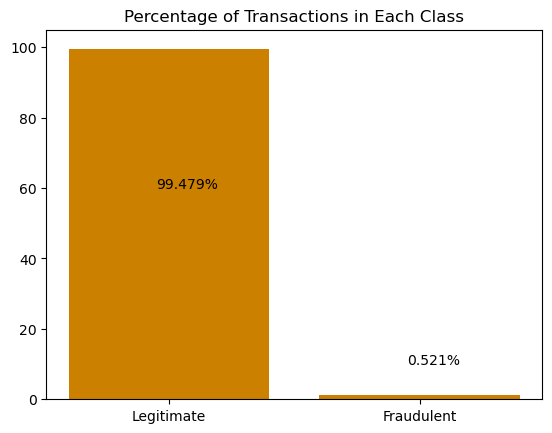

In [28]:
# Graph: Fradulent transactions proportion

# normalizing the class label counts to set the heights of the bars and the displays
counts = full_set["is_fraud"].value_counts(normalize=True) * 100
counts[1] = counts[1] + 0.6 # ensuring that the bar for the minority class is actually visible

# creating a bar plot
plt.bar(x = full_set["is_fraud"].unique(), height = counts, color = (0.8,0.5,0), tick_label = ['Legitimate', 'Fraudulent'])
plt.title(label = 'Percentage of Transactions in Each Class')
plt.ylim(0,105) # expanding y-axis upward for better visual aesthetic

# creating and roughly centering the labels
plt.text(x = -0.05, y = 60, s = "{0:5.3f}%".format(counts[0]))
plt.text(x = 0.95, y = 10, s = "{0:4.3f}%".format(counts[1] - 0.6)) # offsetting minority class bar height adjustment for text display
plt.show()

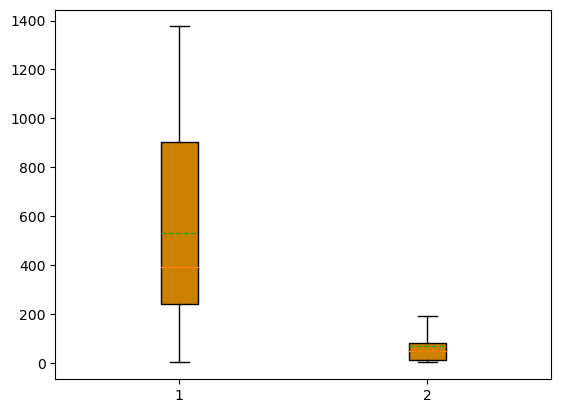

In [66]:
# Graph: Average fraud amount

data = full_set[full_set['is_fraud']==1]['amount(usd)']
data2 = full_set[full_set['is_fraud']==0]['amount(usd)']
dataframe = [data,data2]
dataframe = datframe.

plt.boxplot(dataframe,showmeans=True,notch=False,meanline=True,autorange=True,patch_artist=True,showfliers=False,boxprops=dict(facecolor=(0.8,0.5,0)))
plt.show()

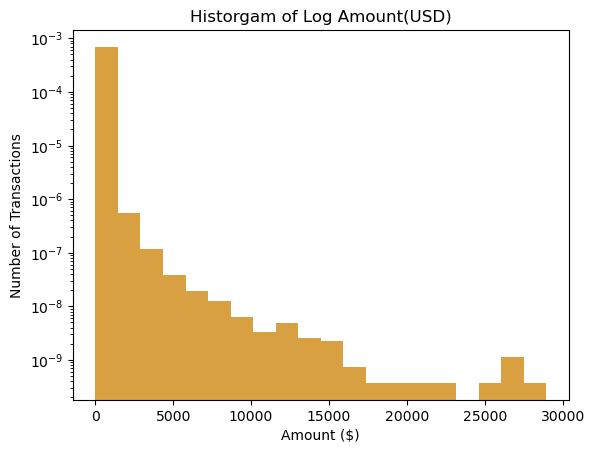

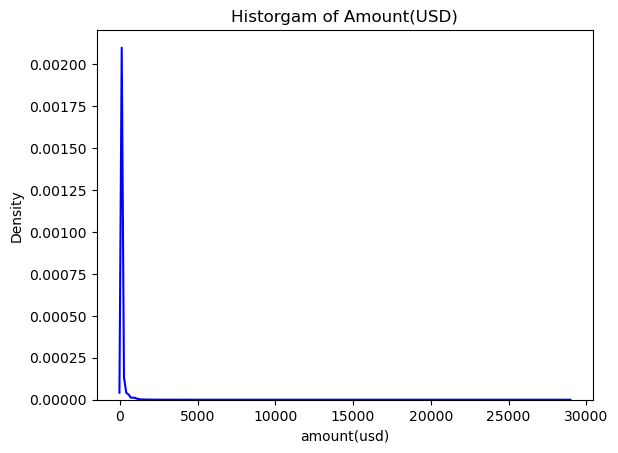

In [29]:
# Graph: amount(usd) x log(number of transactions)

n, bins, patches = plt.hist(full_set['amount(usd)'], 20, density=True, facecolor=(0.8,0.5,0), alpha=0.75)
plt.title('Historgam of Log Amount(USD)')
plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.yscale('log')
plt.show()
sns.kdeplot(full_set['amount(usd)'],color='blue')
plt.title('Historgam of Amount(USD)')
plt.show()

In [30]:
# Checking the Shapiro result for log and original form of variable 'amount(usd)'

print(f'The Shapiro result for amount(usd) is')
print(shapiro(full_set['amount(usd)']))

full_set['amount_log'] = np.log(full_set['amount(usd)'])
print(f'The Shapiro result for amount_log is')
print(shapiro(full_set['amount_log']))

The Shapiro result for amount(usd) is
ShapiroResult(statistic=0.27114129066467285, pvalue=0.0)
The Shapiro result for amount_log is
ShapiroResult(statistic=0.961155891418457, pvalue=0.0)


/Users/Sarb/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")
/Users/Sarb/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


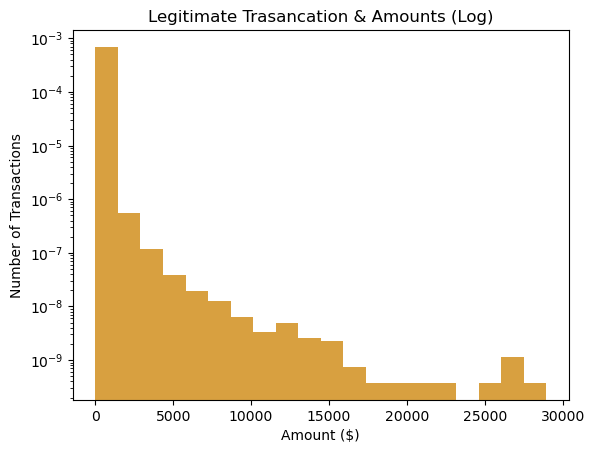

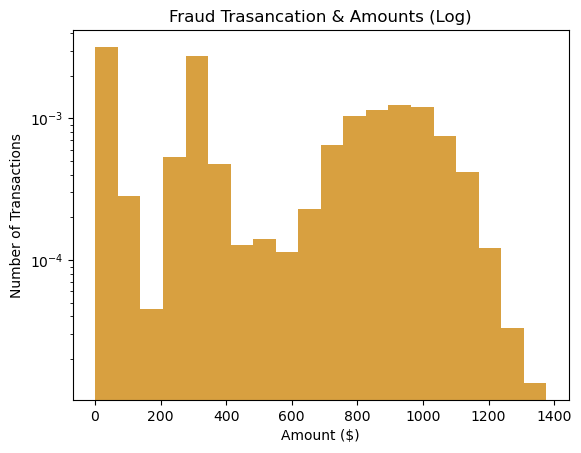

In [31]:
# Graph: Distribution of legitimate & fraud transactions amounts

n, bins, patches = plt.hist(full_set['amount(usd)'][full_set.is_fraud == 0], 20, density=True, facecolor=(0.8,0.5,0), alpha=0.75)
plt.title('Legitimate Trasancation & Amounts (Log)')
plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.yscale('log')
plt.show()

n, bins, patches = plt.hist(full_set['amount(usd)'][full_set.is_fraud == 1], 20, density=True, facecolor=(0.8,0.5,0), alpha=0.75)
plt.title('Fraud Trasancation & Amounts (Log)')
plt.xlabel('Amount ($)')
plt.ylabel('Number of Transactions')
plt.yscale('log')
plt.show()

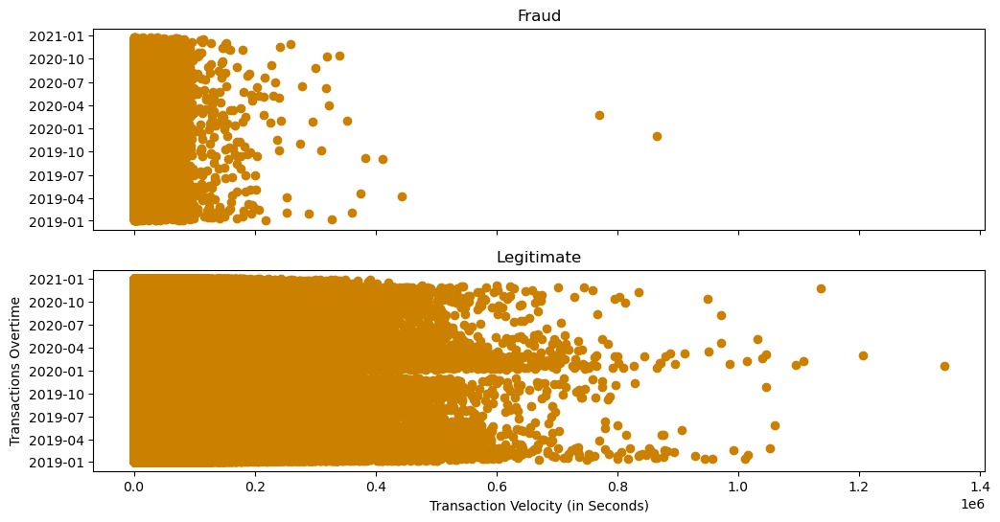

In [32]:
# Graph: Velocity (in seconds) of fraud & legitimate transactions

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,6))

ax1.scatter(full_set['velocity'][full_set.is_fraud == 1], full_set['transaction_time'][full_set.is_fraud == 1], color = (0.8,0.5,0))
ax1.set_title('Fraud')

ax2.scatter(full_set['velocity'][full_set.is_fraud == 0], full_set['transaction_time'][full_set.is_fraud == 0], color = (0.8,0.5,0))
ax2.set_title('Legitimate')

plt.xlabel('Transaction Velocity (in Seconds)')
plt.ylabel('Transactions Overtime')
plt.show()

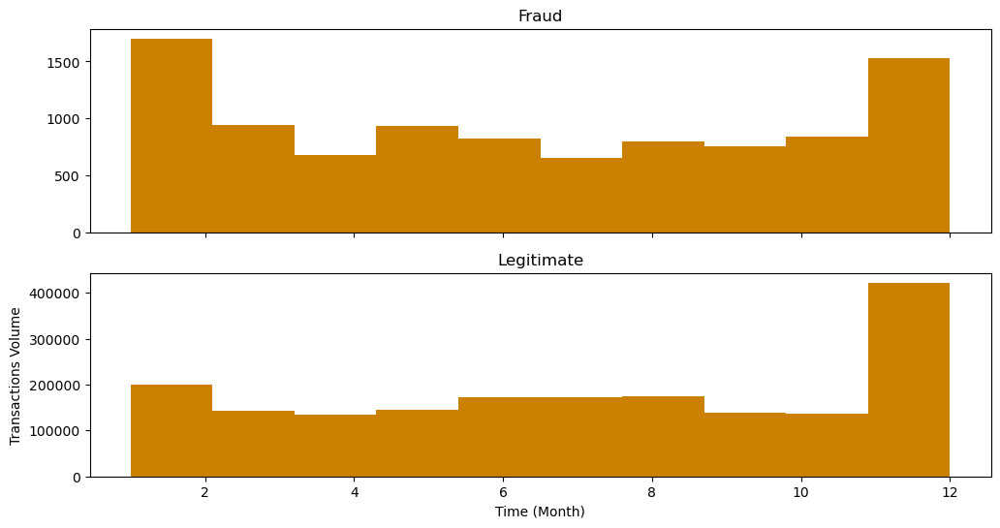

In [33]:
# Graph: Distribution of fraud & legitimate transactions by month

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,6))

ax1.hist(full_set['month'][full_set.is_fraud == 1],color = (0.8,0.5,0))
ax1.set_title('Fraud')

ax2.hist(full_set['month'][full_set.is_fraud == 0],color = (0.8,0.5,0))
ax2.set_title('Legitimate')

plt.xlabel('Time (Month)')
plt.ylabel('Transactions Volume')
plt.show()

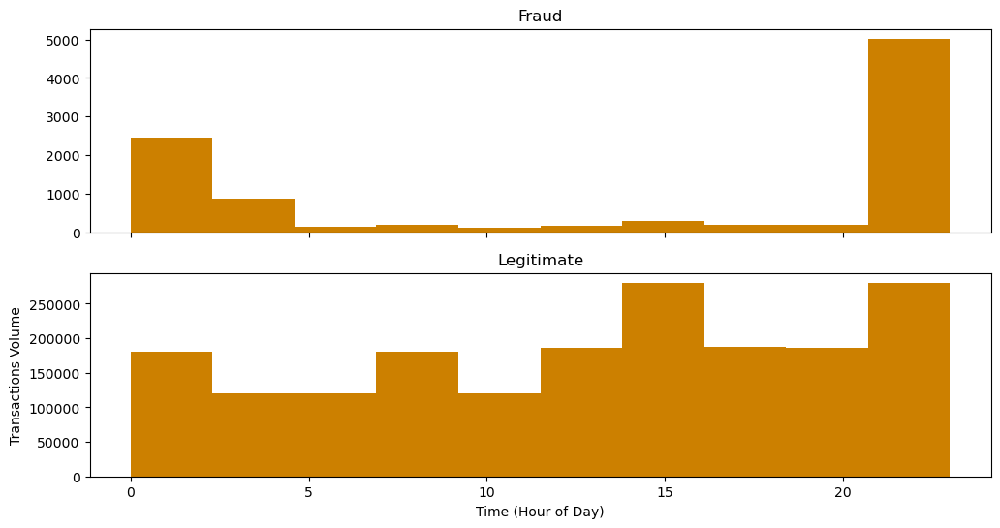

In [34]:
# Graph: Distribution of fraud & legitimate transactions by hour of day

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,6))

ax1.hist(full_set['hour_of_day'][full_set.is_fraud == 1],color = (0.8,0.5,0))
ax1.set_title('Fraud')

ax2.hist(full_set['hour_of_day'][full_set.is_fraud == 0],color = (0.8,0.5,0))
ax2.set_title('Legitimate')

plt.xlabel('Time (Hour of Day)')
plt.ylabel('Transactions Volume')
plt.show()

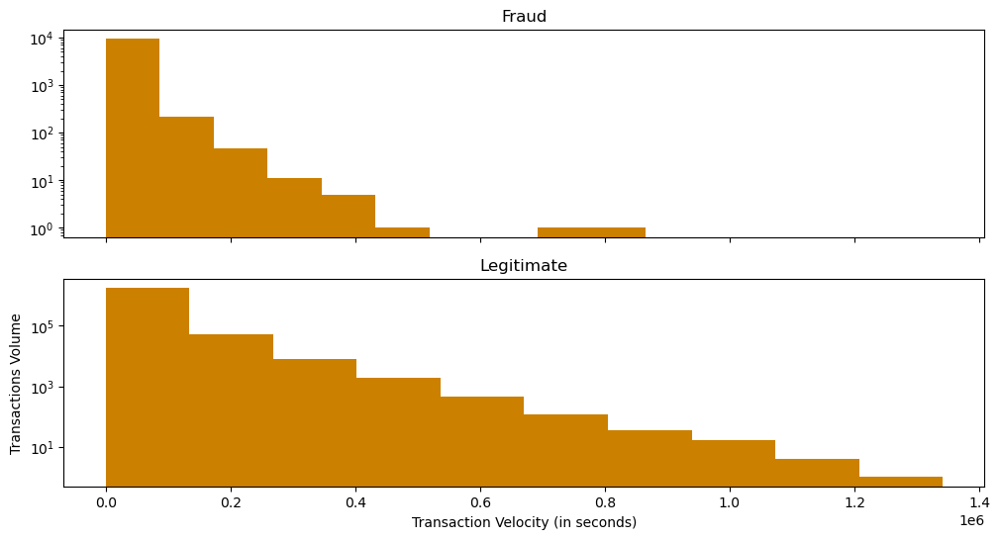

In [35]:
# Graph: Distribution of fraud & legitimate transactions by transaction velocity

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,6))

ax1.hist(full_set['velocity'][full_set.is_fraud == 1],color = (0.8,0.5,0))
ax1.set_title('Fraud')
ax1.set_yscale('log')

ax2.hist(full_set['velocity'][full_set.is_fraud == 0],color = (0.8,0.5,0))
ax2.set_title('Legitimate')

plt.xlabel('Transaction Velocity (in seconds)')
plt.ylabel('Transactions Volume')
plt.yscale('log')
plt.show()

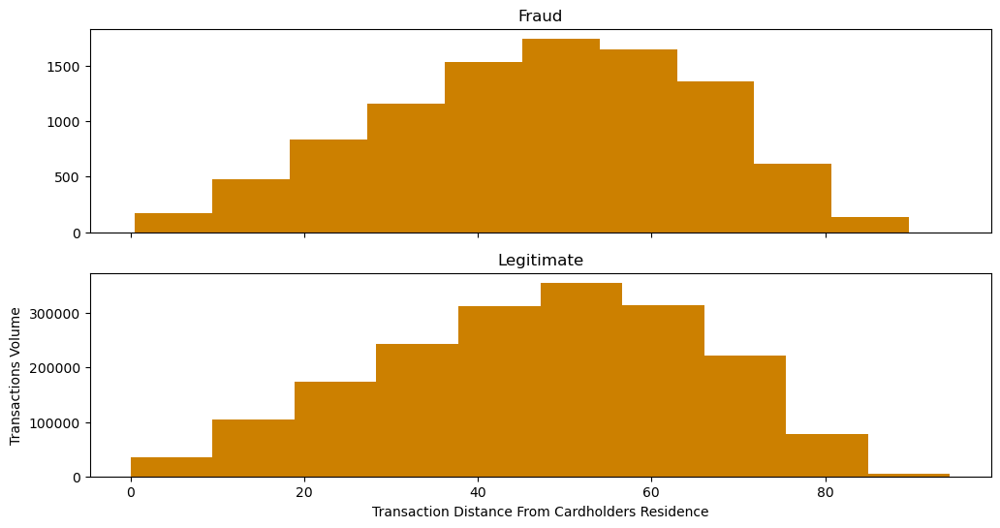

In [36]:
# Graph: Distribution of fraud & legitimate transactions by 'distance from home'

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,6))

ax1.hist(full_set['distance_from_home'][full_set.is_fraud == 1],color = (0.8,0.5,0))
ax1.set_title('Fraud')

ax2.hist(full_set['distance_from_home'][full_set.is_fraud == 0],color = (0.8,0.5,0))
ax2.set_title('Legitimate')

plt.xlabel('Transaction Distance From Cardholders Residence')
plt.ylabel('Transactions Volume')
plt.show()

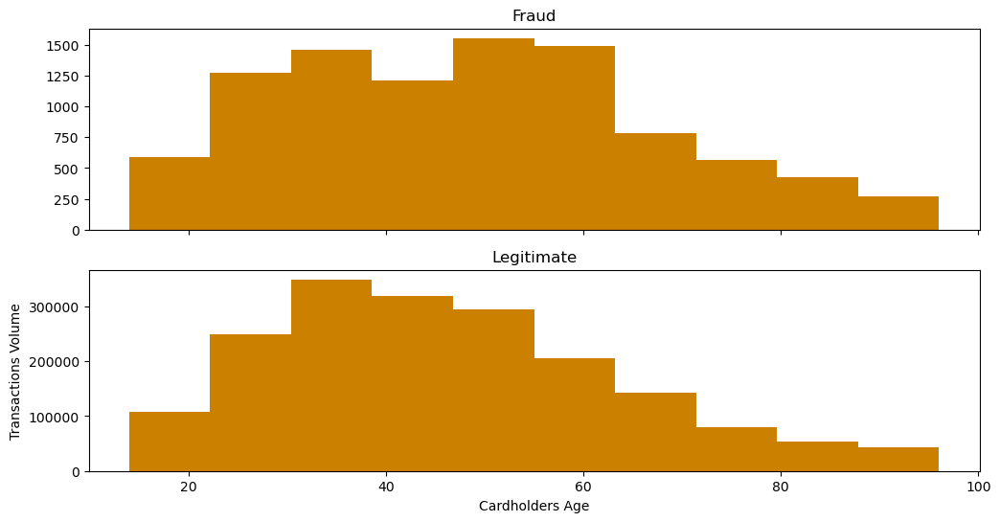

In [37]:
# Graph: Distribution of fraud & legitimate transactions by age

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,6))

ax1.hist(full_set['age'][full_set.is_fraud == 1],color = (0.8,0.5,0))
ax1.set_title('Fraud')

ax2.hist(full_set['age'][full_set.is_fraud == 0],color = (0.8,0.5,0))
ax2.set_title('Legitimate')

plt.xlabel('Cardholders Age')
plt.ylabel('Transactions Volume')
plt.show()

In [38]:
# Graph: Scatterplot of weekly average fraud & legitimate transaction spend by shopping category

grouped_set = full_set.groupby(by=[pd.Grouper(key="transaction_time", freq="1W"),
                                   'is_fraud','category']).agg({"amount(usd)":'mean'}).reset_index()

fig = px.scatter(grouped_set,
        x='transaction_time',
        y='amount(usd)',
        color='is_fraud',
        facet_col ='category',
        facet_col_wrap=3,
        facet_col_spacing=.04,
        color_discrete_map={0:'green', 1:'rgb(80%,50%,0)'}
)

fig.update_layout(height=1400,
                  width=960,
                  legend=dict(title='Is fraud?'),
                  plot_bgcolor='#fafafa'
                 )

fig.update_yaxes(matches=None)
fig.for_each_yaxis(lambda yaxis: yaxis.update(showticklabels=True))
fig.for_each_xaxis(lambda xaxis: xaxis.update(showticklabels=True, title=''))
fig.show()

In [39]:
# Graph: Scatterplot of weekly average fraud & legitimate transaction spend by merchant

top12_merchants = full_set.merchant.value_counts()[:12]

grouped_set = full_set.groupby(by=[pd.Grouper(key="transaction_time", freq="1W"),'is_fraud',
                           'merchant']).agg({"amount(usd)":'mean'}).reset_index()

grouped_set = full_set[full_set.merchant.isin(top12_merchants.index)]

fig = px.scatter(grouped_set,
        x='transaction_time',
        y='amount(usd)',
        color='is_fraud',
        facet_col ='merchant',
        facet_col_wrap=3,
        facet_col_spacing=.06,
        category_orders={'merchant': top12_merchants.index}, # order the subplots
        color_discrete_map={0:'green', 1:'rgb(80%,50%,0)'}
)

fig.update_layout(height=1200,
                  width=960,
                  title='Top 12 merchants with the highest number of transactions per week',
                  legend=dict(title='Is fraud?'),
                  plot_bgcolor='#fafafa'
                 )

fig.update_yaxes(matches=None)
fig.for_each_yaxis(lambda yaxis: yaxis.update(showticklabels=True))
fig.for_each_xaxis(lambda xaxis: xaxis.update(showticklabels=True, title=''))

fig.show();

<div class="alert alert-block alert-warning">

**TASK 3: DATA PRE-PROCESSING**
<div class="alert alert-block alert-warning">

In [42]:
# Checking column names to create new objects below
training_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 21 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   transaction_time    1296675 non-null  datetime64[ns]
 1   credit_card_number  1296675 non-null  category      
 2   merchant            1296675 non-null  category      
 3   category            1296675 non-null  category      
 4   amount(usd)         1296675 non-null  float64       
 5   gender              1296675 non-null  category      
 6   street_apt_number   1296675 non-null  category      
 7   city                1296675 non-null  category      
 8   state               1296675 non-null  category      
 9   zip_code            1296675 non-null  category      
 10  city_population     1296675 non-null  int64         
 11  job                 1296675 non-null  category      
 12  is_fraud            1296675 non-null  category      
 13  hour_of_day 

In [68]:
# Defining X_train, X_test, y_train, and y_test

X_train = training_set.drop(columns=["transaction_time","is_fraud","month","hour_of_day"], axis=1)
y_train = training_set['is_fraud'].astype(int)
features_list = list(X_train.columns)
X_train_categorical = training_set[["credit_card_number","merchant","category","gender","street_apt_number","city","state","zip_code","job","hour_of_day_cat","full_name"]]
cat_features = list(X_train_categorical.columns)
X_test = test_set[features_list]
y_test = test_set['is_fraud'].astype(int)

In [69]:
# One-Hot Encoding "gender" variables

ohe_train = OneHotEncoder(cols=['gender'], handle_unknown='error').fit(X_train, y_train)
X_train_ohe = ohe_train.transform(X_train)
print(X_train_ohe.info())

ohe_train = OneHotEncoder(cols=['gender'], handle_unknown='error').fit(X_test, y_test)
X_test_ohe = ohe_train.transform(X_test)
print(X_test_ohe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 18 columns):
 #   Column              Non-Null Count    Dtype   
---  ------              --------------    -----   
 0   credit_card_number  1296675 non-null  category
 1   merchant            1296675 non-null  category
 2   category            1296675 non-null  category
 3   amount(usd)         1296675 non-null  float64 
 4   gender_1            1296675 non-null  int64   
 5   gender_2            1296675 non-null  int64   
 6   street_apt_number   1296675 non-null  category
 7   city                1296675 non-null  category
 8   state               1296675 non-null  category
 9   zip_code            1296675 non-null  category
 10  city_population     1296675 non-null  int64   
 11  job                 1296675 non-null  category
 12  hour_of_day_cat     1296675 non-null  category
 13  month_cat           1296675 non-null  category
 14  velocity            1296675 non-null  float64 
 15

In [70]:
# Further splitting onehotencoded X_train and y_train into a validation X and y set

X_train_ohe, X_valid_ohe, y_train_ohe, y_valid_ohe = train_test_split(X_train_ohe, y_train, random_state=6)
print(f'{X_train_ohe.info()}')
print(f'{X_valid_ohe.info()}')
print(f'{y_train_ohe.shape}')
print(f'{y_valid_ohe.shape}')
X_train_ohe.head(10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 972506 entries, 532343 to 1211274
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype   
---  ------              --------------   -----   
 0   credit_card_number  972506 non-null  category
 1   merchant            972506 non-null  category
 2   category            972506 non-null  category
 3   amount(usd)         972506 non-null  float64 
 4   gender_1            972506 non-null  int64   
 5   gender_2            972506 non-null  int64   
 6   street_apt_number   972506 non-null  category
 7   city                972506 non-null  category
 8   state               972506 non-null  category
 9   zip_code            972506 non-null  category
 10  city_population     972506 non-null  int64   
 11  job                 972506 non-null  category
 12  hour_of_day_cat     972506 non-null  category
 13  month_cat           972506 non-null  category
 14  velocity            972506 non-null  float64 
 15  age        

,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,street_apt_number,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name
532343,4220345354880,fraud_Lesch Ltd,shopping_pos,8.16,0,1,27386 Snyder Station,Oxford,MI,48371,24840,Agricultural consultant,L,H,14363.0,59,74.354651,PatrickTorres
1161490,5456712664803820,fraud_Spencer-Runolfsson,misc_pos,4.91,1,0,36659 Smith Club Apt. 080,Llano,NM,87543,247,Architectural technologist,D,D,1129.0,59,55.486067,PamelaMatthews
676609,3590736522064285,fraud_Wuckert-Walter,grocery_net,50.65,1,0,72966 Shannon Pass Apt. 391,Bauxite,AR,72011,4074,"Scientist, audiological",C,J,2764.0,44,43.297079,KimberlyGonzalez
1227684,4797297220948468262,fraud_Kris-Padberg,shopping_pos,17.48,1,0,3310 Davidson Spurs Apt. 107,Oolitic,IN,47451,1228,Counsellor,M,E,28061.0,29,45.771905,EricaBriggs
44562,213174467670432,fraud_Padberg-Rogahn,entertainment,9.29,0,1,7055 Fernandez Estates Apt. 676,Cecilton,MD,21913,663,Podiatrist,P,A,5600.0,50,69.300278,JamesBishop
929438,343746486082492,fraud_Kuphal-Predovic,misc_net,4.48,0,1,836 Stephanie Union,Cedar,MI,49621,3096,"Social research officer, government",H,A,63004.0,45,66.991930,JeffreyMunoz
880883,630471368021,fraud_Kautzer and Sons,personal_care,62.28,0,1,22502 Baker Mount Suite 241,Hazel,KY,42049,1480,"Designer, interior/spatial",M,L,20017.0,45,34.007435,GeorgeFloyd
321555,6593250708747804,fraud_Vandervort-Funk,grocery_pos,180.81,1,0,244 Abbott Parkway,Loxahatchee,FL,33470,26551,Paramedic,C,F,12685.0,42,41.762277,MelissaMeza
1046119,4450831335606294,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,24.09,1,0,6760 Donovan Lakes,Clayton,OK,74536,1760,Occupational psychologist,U,C,19276.0,48,68.687800,DonnaDavis
791672,4428780983793657331,fraud_Pacocha-Bauch,shopping_pos,9.83,0,1,7683 Natasha Way Apt. 945,Waukesha,WI,53186,95015,"Therapist, occupational",I,L,6601.0,73,25.380601,RichardWaters


In [72]:
%%time

# After one-hot encoding, we now target encode the categorical variables using a stratified k-fold nested cross-validation approach to reduce overfitting

HNTE_encoder = NestedCVWrapper((TargetEncoder)(min_samples_leaf=20, smoothing=10),cv=5,random_state=21)
X_train_hnte, X_valid_hnte, X_test_hnte = HNTE_encoder.fit_transform(X_train_ohe, y_train_ohe, X_test=(X_valid_ohe, X_test_ohe))
print(X_train_hnte.info())
X_train_hnte.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 972506 entries, 0 to 972505
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   credit_card_number  972506 non-null  float64
 1   merchant            972506 non-null  float64
 2   category            972506 non-null  float64
 3   amount(usd)         972506 non-null  float64
 4   gender_1            972506 non-null  float64
 5   gender_2            972506 non-null  float64
 6   street_apt_number   972506 non-null  float64
 7   city                972506 non-null  float64
 8   state               972506 non-null  float64
 9   zip_code            972506 non-null  float64
 10  city_population     972506 non-null  float64
 11  job                 972506 non-null  float64
 12  hour_of_day_cat     972506 non-null  float64
 13  month_cat           972506 non-null  float64
 14  velocity            972506 non-null  float64
 15  age                 972506 non-nul

,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,street_apt_number,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name
0,0.004215,0.008804,0.006762,8.16,0.0,1.0,0.004215,0.004215,0.005202,0.004215,24840.0,0.002975,0.001147,0.004338,14363.0,59.0,74.354651,0.004215
1,0.000000,0.005435,0.003233,4.91,1.0,0.0,0.000000,0.000000,0.005025,0.000000,247.0,0.000000,0.013671,0.004853,1129.0,59.0,55.486067,0.000000
2,0.002212,0.005515,0.002677,50.65,1.0,0.0,0.002212,0.002212,0.005462,0.002212,4074.0,0.004208,0.014266,0.007084,2764.0,44.0,43.297079,0.002212
3,0.000000,0.002232,0.006762,17.48,1.0,0.0,0.000000,0.000000,0.005347,0.000000,1228.0,0.001780,0.001048,0.006302,28061.0,29.0,45.771905,0.000000
4,0.011828,0.001736,0.002548,9.29,0.0,1.0,0.011828,0.011828,0.005935,0.011828,663.0,0.007651,0.001378,0.007971,5600.0,50.0,69.300278,0.011828
5,0.000000,0.014628,0.014781,4.48,0.0,1.0,0.000000,0.000000,0.005202,0.000000,3096.0,0.000000,0.001381,0.007608,63004.0,45.0,66.991930,0.000000
6,0.019481,0.003506,0.002411,62.28,0.0,1.0,0.019481,0.019481,0.004858,0.019481,1480.0,0.010764,0.001073,0.004097,20017.0,45.0,34.007435,0.019481
7,0.003297,0.018493,0.014166,180.81,1.0,0.0,0.003297,0.003297,0.006620,0.003297,26551.0,0.003009,0.014906,0.004770,12685.0,42.0,41.762277,0.003297
8,0.001595,0.000961,0.001633,24.09,1.0,0.0,0.001595,0.001595,0.005047,0.001595,1760.0,0.004045,0.001001,0.006340,19276.0,48.0,68.687800,0.001595
9,0.000000,0.004919,0.006762,9.83,0.0,1.0,0.000000,0.000000,0.005195,0.000000,95015.0,0.002600,0.001138,0.004029,6601.0,73.0,25.380601,0.000000


In [73]:
# Checking correlation matrix

correlation = pd.concat([X_train_hnte, y_train_ohe])
correlation.corr()

,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,street_apt_number,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name,0
credit_card_number,1.000000,0.017613,0.018888,0.059259,-0.064782,0.064782,1.000000,0.933587,0.159877,0.990958,-0.007650,0.596634,0.030844,0.007380,0.179944,0.082115,-0.000199,0.992743,NaN
merchant,0.017613,1.000000,0.914390,0.090876,0.008801,-0.008801,0.017613,0.015538,0.000947,0.017325,-0.000248,0.007546,0.007324,0.000594,0.001445,-0.000295,0.001843,0.017449,NaN
category,0.018888,0.914390,1.000000,0.099159,0.009797,-0.009797,0.018888,0.016359,0.001562,0.018616,-0.000386,0.007453,0.007996,0.000807,0.002380,-0.000616,0.001841,0.018578,NaN
amount(usd),0.059259,0.090876,0.099159,1.000000,-0.001631,0.001631,0.059259,0.052086,0.002811,0.058504,0.005676,0.028887,0.030927,0.002617,-0.003265,-0.010020,-0.001123,0.058325,NaN
gender_1,-0.064782,0.008801,0.009797,-0.001631,1.000000,-1.000000,-0.064782,-0.064943,-0.033454,-0.068264,0.028765,-0.053428,-0.000494,-0.000063,-0.056019,-0.004976,0.002118,-0.063190,NaN
gender_2,0.064782,-0.008801,-0.009797,0.001631,-1.000000,1.000000,0.064782,0.064943,0.033454,0.068264,-0.028765,0.053428,0.000494,0.000063,0.056019,0.004976,-0.002118,0.063190,NaN
street_apt_number,1.000000,0.017613,0.018888,0.059259,-0.064782,0.064782,1.000000,0.933587,0.159877,0.990958,-0.007650,0.596634,0.030844,0.007380,0.179944,0.082115,-0.000199,0.992743,NaN
city,0.933587,0.015538,0.016359,0.052086,-0.064943,0.064943,0.933587,1.000000,0.146409,0.942113,0.017500,0.555543,0.026867,0.006648,0.177658,0.075753,-0.000458,0.928764,NaN
state,0.159877,0.000947,0.001562,0.002811,-0.033454,0.033454,0.159877,0.146409,1.000000,0.161011,-0.027408,0.135294,0.002197,-0.000096,0.045134,0.052585,-0.010871,0.145732,NaN
zip_code,0.990958,0.017325,0.018616,0.058504,-0.068264,0.068264,0.990958,0.942113,0.161011,1.000000,-0.007533,0.583511,0.030376,0.007323,0.177779,0.081069,-0.000449,0.983659,NaN


In [74]:
# Dropping "street_apt_number" column

X_train_hnte = X_train_hnte.drop(columns=["street_apt_number"], axis=1)
X_valid_hnte = X_valid_hnte.drop(columns=["street_apt_number"], axis=1)
X_test_hnte = X_test_hnte.drop(columns=["street_apt_number"], axis=1)
X_train_hnte.head(10)

,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name
0,0.004215,0.008804,0.006762,8.16,0.0,1.0,0.004215,0.005202,0.004215,24840.0,0.002975,0.001147,0.004338,14363.0,59.0,74.354651,0.004215
1,0.000000,0.005435,0.003233,4.91,1.0,0.0,0.000000,0.005025,0.000000,247.0,0.000000,0.013671,0.004853,1129.0,59.0,55.486067,0.000000
2,0.002212,0.005515,0.002677,50.65,1.0,0.0,0.002212,0.005462,0.002212,4074.0,0.004208,0.014266,0.007084,2764.0,44.0,43.297079,0.002212
3,0.000000,0.002232,0.006762,17.48,1.0,0.0,0.000000,0.005347,0.000000,1228.0,0.001780,0.001048,0.006302,28061.0,29.0,45.771905,0.000000
4,0.011828,0.001736,0.002548,9.29,0.0,1.0,0.011828,0.005935,0.011828,663.0,0.007651,0.001378,0.007971,5600.0,50.0,69.300278,0.011828
5,0.000000,0.014628,0.014781,4.48,0.0,1.0,0.000000,0.005202,0.000000,3096.0,0.000000,0.001381,0.007608,63004.0,45.0,66.991930,0.000000
6,0.019481,0.003506,0.002411,62.28,0.0,1.0,0.019481,0.004858,0.019481,1480.0,0.010764,0.001073,0.004097,20017.0,45.0,34.007435,0.019481
7,0.003297,0.018493,0.014166,180.81,1.0,0.0,0.003297,0.006620,0.003297,26551.0,0.003009,0.014906,0.004770,12685.0,42.0,41.762277,0.003297
8,0.001595,0.000961,0.001633,24.09,1.0,0.0,0.001595,0.005047,0.001595,1760.0,0.004045,0.001001,0.006340,19276.0,48.0,68.687800,0.001595
9,0.000000,0.004919,0.006762,9.83,0.0,1.0,0.000000,0.005195,0.000000,95015.0,0.002600,0.001138,0.004029,6601.0,73.0,25.380601,0.000000


In [80]:
# Checking number of CPUs in the system

import os
  
n_cpu = os.cpu_count()
print("Number of CPUs in the system:", n_cpu)

Number of CPUs in the system: 8


In [93]:
%%time

# Performing SMOTE transformation on our data
ST = SMOTE(random_state=0, n_jobs=-1)
X_train_SMOTE, y_train_SMOTE = ST.fit_resample(X_train_hnte, y_train_ohe)

print("Before SMOTE:", Counter(y_train_ohe))
print("After SMOTE:", Counter(y_train_SMOTE))

Before SMOTE: Counter({0: 966915, 1: 5591})
After SMOTE: Counter({0: 966915, 1: 966915})
CPU times: user 2.32 s, sys: 792 ms, total: 3.11 s
Wall time: 2.6 s


In [94]:
# Running data through "robust scaler" before model training and tuning

rs = RobustScaler()
X_train_rsmote = rs.fit_transform(X_train_SMOTE)
X_train_rs = rs.fit_transform(X_train_hnte)
X_valid_rs = rs.fit_transform(X_valid_hnte)
X_test_rs = rs.fit_transform(X_test_hnte)

<div class="alert alert-block alert-warning">

**TASK 3: CHAMPION ALGORITHM: RANDOM FOREST**
<div class="alert alert-block alert-warning">

In [296]:
# We define performance metrics function to assess our algorithms

def performance(y_real, y_predicted):
    metrics = {'ROC AUC SCORE': roc_auc_score} # dictionary
    for metric, func  in metrics.items():
        print(metric+': %.2f'%(func(y_real, y_predicted)))
    RocCurveDisplay.from_predictions(y_real.ravel(), 
                                 y_predicted.ravel(),
                                 color="darkorange",
                                    )
    plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
    plt.axis("square")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.show()
    PrecisionRecallDisplay.from_predictions(y_real, y_predicted)
    plt.show()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    322254
           1       0.96      0.71      0.82      1915

    accuracy                           1.00    324169
   macro avg       0.98      0.86      0.91    324169
weighted avg       1.00      1.00      1.00    324169

ROC AUC SCORE: 0.86


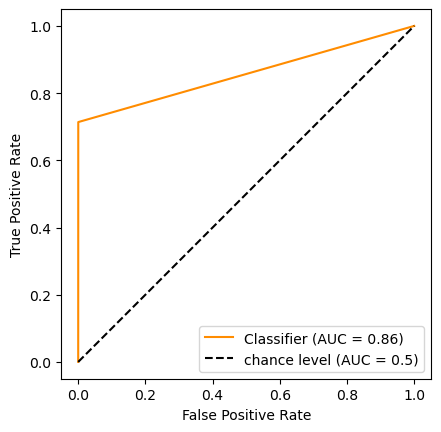

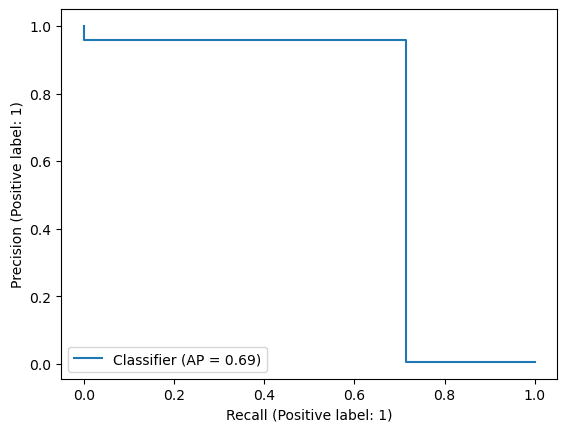

CPU times: user 14min 49s, sys: 6.45 s, total: 14min 55s
Wall time: 2min 23s


In [298]:
%%time

# Model with non-SMOTE Data

model = RandomForestClassifier(random_state=4,n_jobs=-1)
model.fit(X_train_rs, y_train_ohe)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

              precision    recall  f1-score   support

           0       0.99      0.35      0.52    322254
           1       0.00      0.48      0.01      1915

    accuracy                           0.35    324169
   macro avg       0.50      0.42      0.26    324169
weighted avg       0.99      0.35      0.52    324169

ROC AUC SCORE: 0.42


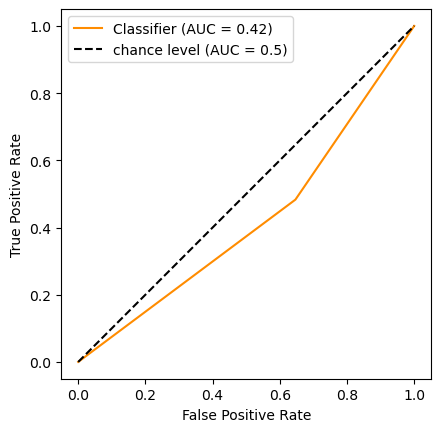

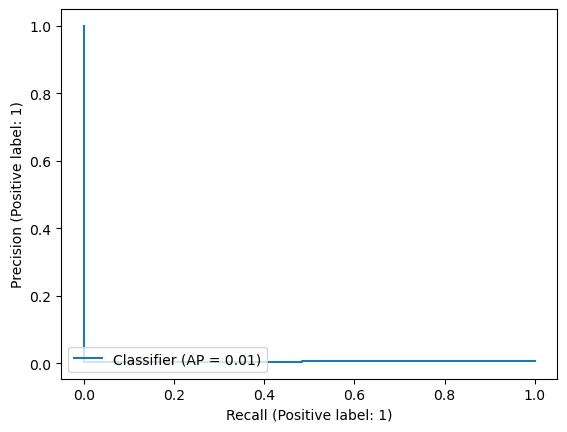

CPU times: user 34min 7s, sys: 13.5 s, total: 34min 20s
Wall time: 5min 30s


In [299]:
%%time

# Model with SMOTE Data
model = RandomForestClassifier(random_state=4,n_jobs=-1)
model.fit(X_train_rsmote, y_train_SMOTE)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [270]:
%%time

# Model with Non-SMOTE data, feature selection, and hyperparameter tuning

# 1. Feature selection through Boruta algorithm
model = RandomForestClassifier(random_state=4,n_jobs=-1,max_features="sqrt")

feat_selector = BorutaPy(model, n_estimators='auto', verbose=2, random_state=1)
feat_selector.fit(X_train_rs, y_train_ohe)

print(f"The selected features by the algorithm are: {feat_selector.support_}")
print(f"Features ranking: {feat_selector.ranking_}")

# 2. call transform() on X to filter it down to selected features
X_rfns_trimmed = feat_selector.transform(X_train_rs)
X_rfns_trimmed.shape

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	9 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	10 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	11 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	12 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	13 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	14 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	15 / 100
Confirmed: 	11
Tentative: 	2
Rejected: 	4
Iteration: 	16 / 100
Confirmed: 	11
Tentative: 	1
Rejected: 	5
I

(972506, 11)

In [272]:
# Dropping "gender_1", "gender_2", "state", "city_population", "month_cat" and "distance_from_home" from both train and validation sets

X_valid_rfns_trimmed = np.delete(X_valid_rs, [4,5,7,9,12,15], 1)

In [408]:
%%time

# Given the feature selection results, we'll only keep optimal features and run a grid search for optimal paramter

# 3. Grid search
classifier = RandomForestClassifier(class_weight='balanced',min_samples_split=5,max_depth=4,n_estimators=60,random_state=4,n_jobs=-1,max_features="sqrt",min_samples_leaf=1,bootstrap=True) 
cv = StratifiedKFold(3)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'min_samples_split':[5,6,7]},
                      scoring='recall', cv=cv, verbose=5, n_jobs=-1)

CV_rfc.fit(X_rfns_trimmed, y_train_ohe)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

Fitting 3 folds for each of 4 candidates, totalling 12 fits
The best estimator is: RandomForestClassifier(class_weight='balanced', max_depth=4,
                       max_features='sqrt', min_samples_split=5,
                       n_estimators=60, n_jobs=-1, random_state=4)
The best parameters are: {'min_samples_split': 5}
The best score is: 0.9468784291953001
CPU times: user 2min 8s, sys: 2.48 s, total: 2min 10s
Wall time: 3min 12s
[CV 3/3] END ......max_depth=4, n_estimators=75;, score=0.943 total time= 2.1min
[CV 3/3] END ......max_depth=5, n_estimators=60;, score=0.940 total time= 2.2min
[CV 2/3] END ......max_depth=6, n_estimators=60;, score=0.939 total time= 2.6min
[CV 1/3] END ......max_depth=7, n_estimators=60;, score=0.936 total time= 2.9min
[CV 3/3] END ......max_depth=7, n_estimators=75;, score=0.930 total time= 2.3min
[CV 1/3] END ......max_depth=4, n_estimators=80;, score=0.949 total time= 2.2min
[CV 3/3] END ......max_depth=5, n_estimators=75;, score=0.941 total time= 2.

              precision    recall  f1-score   support

           0       1.00      0.94      0.97    322254
           1       0.08      0.95      0.15      1915

    accuracy                           0.94    324169
   macro avg       0.54      0.94      0.56    324169
weighted avg       0.99      0.94      0.96    324169

ROC AUC SCORE: 0.94


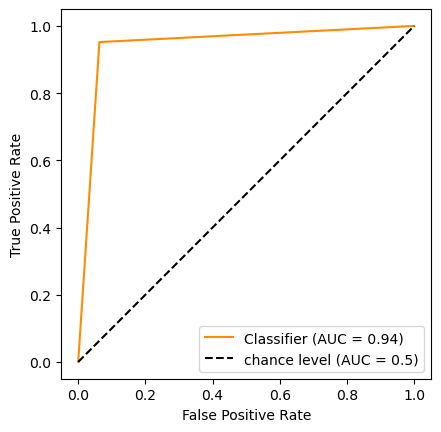

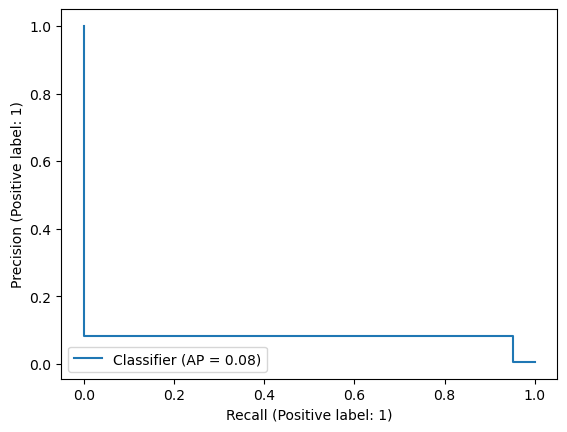

CPU times: user 2min 8s, sys: 2.69 s, total: 2min 11s
Wall time: 23.6 s
[CV 3/3] END ......max_depth=4, n_estimators=60;, score=0.943 total time= 1.7min
[CV 3/3] END ......max_depth=4, n_estimators=80;, score=0.944 total time= 2.2min
[CV 1/3] END ......max_depth=6, n_estimators=60;, score=0.939 total time= 2.6min
[CV 1/3] END ......max_depth=6, n_estimators=80;, score=0.940 total time= 3.3min
[CV 1/3] END ......max_depth=7, n_estimators=80;, score=0.934 total time= 2.3min
[CV 2/3] END ......max_depth=4, n_estimators=60;, score=0.946 total time= 1.8min
[CV 1/3] END ......max_depth=5, n_estimators=60;, score=0.945 total time= 2.1min
[CV 2/3] END ......max_depth=5, n_estimators=80;, score=0.944 total time= 2.6min
[CV 3/3] END ......max_depth=6, n_estimators=80;, score=0.936 total time= 3.2min
[CV 2/3] END ......max_depth=7, n_estimators=80;, score=0.937 total time= 2.0min
[CV 2/3] END max_depth=3, min_samples_split=2, n_estimators=65;, score=0.930 total time= 1.3min
[CV 2/3] END max_depth

In [409]:
%%time

# 4. Model with non-SMOTE Data after Feature Selection and Hyperparameter Tuming

model = RandomForestClassifier(class_weight='balanced',
                               max_depth=4,
                               n_estimators=60,
                               random_state=4,
                               n_jobs=-1,
                               min_samples_split=5,
                               max_features="sqrt",
                               min_samples_leaf=1,
                               bootstrap=True)
model.fit(X_rfns_trimmed, y_train_ohe)
predicted = model.predict(X_valid_rfns_trimmed)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [271]:
%%time

# Model with SMOTE data, feature selection, and hyperparameter tuning

# 1. Feature selection
model = RandomForestClassifier(random_state=4,n_jobs=-1,max_features="sqrt")

feat_selector = BorutaPy(model, n_estimators='auto', verbose=2, random_state=1)
feat_selector.fit(X_train_rsmote, y_train_SMOTE)

print(f"The selected features by the algorithm are: {feat_selector.support_}")
print(f"Features ranking: {feat_selector.ranking_}")

# 2. call transform() on X to filter it down to selected features
X_rfsmote_trimmed = feat_selector.transform(X_train_rs)
X_rfsmote_trimmed.shape

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	17
Tentative: 	0
Rejected: 	0


BorutaPy finished running.

Iteration: 	9 / 100
Confirmed: 	17
Tentative: 	0
Rejected: 	0
The selected features by the algorithm are: [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True]
Features ranking: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
CPU times: user 3h 37min 42s, sys: 1min 50s, total: 3h 39min 33s
Wall time: 34min 52s


(972506, 17)

In [579]:
%%time

# Given the feature selection results, we'll only keep optimal features and run a grid search for optimal paramter

# 3. Grid search
classifier = RandomForestClassifier(random_state=4,n_jobs=-1,class_weight='balanced',max_features="sqrt",min_samples_leaf=1,bootstrap=True) 
cv = StratifiedKFold(3)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'n_estimators':[100,10],
                                  'max_depth':[None,4],
                                 'min_samples_split':[2,5]},
                      scoring='recall', cv=cv, verbose=5, n_jobs=-1)

CV_rfc.fit(X_train_rsmote, y_train_SMOTE)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV 2/3] END max_depth=None, min_samples_split=2, n_estimators=100;, score=0.999 total time=31.0min
[CV 3/3] END max_depth=4, min_samples_split=2, n_estimators=100;, score=0.954 total time= 8.9min
[CV 1/3] END max_depth=4, min_samples_split=5, n_estimators=60;, score=0.959 total time= 7.0min
[CV 2/3] END max_depth=None, min_samples_split=2, n_estimators=60;, score=0.999 total time=17.8min
[CV 2/3] END max_depth=None, min_samples_split=5, n_estimators=60;, score=0.999 total time=19.0min
[CV 1/3] END max_depth=4, min_samples_split=5, n_estimators=100;, score=0.958 total time=10.7min
[CV 3/3] END max_depth=None, min_samples_split=2, n_estimators=60;, score=0.999 total time=17.5min
[CV 3/3] END max_depth=None, min_samples_split=5, n_estimators=100;, score=0.999 total time=30.3min
[CV 1/3] END max_depth=None, min_samples_split=5, n_estimators=100;, score=0.997 total time=30.6min
[CV 3/3] END max_depth=None, min_samples_split=5, n_e

Iteration 1, loss = 0.04043571
Validation score: 0.995974
Iteration 2, loss = 0.01746691
Validation score: 0.996190
Iteration 3, loss = 0.01678070
Validation score: 0.996345
Iteration 4, loss = 0.01614493
Validation score: 0.996406
Iteration 5, loss = 0.01549747
Validation score: 0.996206
Iteration 6, loss = 0.01477331
Validation score: 0.996622
Iteration 7, loss = 0.01425962
Validation score: 0.996622
Iteration 8, loss = 0.01377312
Validation score: 0.996591
Iteration 9, loss = 0.01344827
Validation score: 0.996730
Iteration 10, loss = 0.01323840
Validation score: 0.996607
Iteration 11, loss = 0.01304950
Validation score: 0.996746
Iteration 12, loss = 0.01290438
Validation score: 0.996869
Iteration 13, loss = 0.01274885
Validation score: 0.996792
Iteration 14, loss = 0.01271573
Validation score: 0.996946
Iteration 15, loss = 0.01256257
Validation score: 0.996823
Iteration 16, loss = 0.01242874
Validation score: 0.996792
Iteration 17, loss = 0.01230921
Validation score: 0.996900
Iterat

Iteration 1, loss = 0.02512342
Validation score: 0.995974
Iteration 2, loss = 0.01659312
Validation score: 0.996129
Iteration 3, loss = 0.01595127
Validation score: 0.995913
Iteration 4, loss = 0.01522789
Validation score: 0.996314
Iteration 5, loss = 0.01463754
Validation score: 0.996082
Iteration 6, loss = 0.01387904
Validation score: 0.996190
Iteration 7, loss = 0.01336085
Validation score: 0.996499
Iteration 8, loss = 0.01290120
Validation score: 0.996514
Iteration 9, loss = 0.01253743
Validation score: 0.996283
Iteration 10, loss = 0.01223369
Validation score: 0.996545
Iteration 11, loss = 0.01201003
Validation score: 0.996622
Iteration 12, loss = 0.01174794
Validation score: 0.996715
Iteration 13, loss = 0.01156759
Validation score: 0.996854
Iteration 14, loss = 0.01138537
Validation score: 0.996854
Iteration 15, loss = 0.01122305
Validation score: 0.996854
Iteration 16, loss = 0.01103765
Validation score: 0.997023
Iteration 17, loss = 0.01094807
Validation score: 0.996931
Iterat

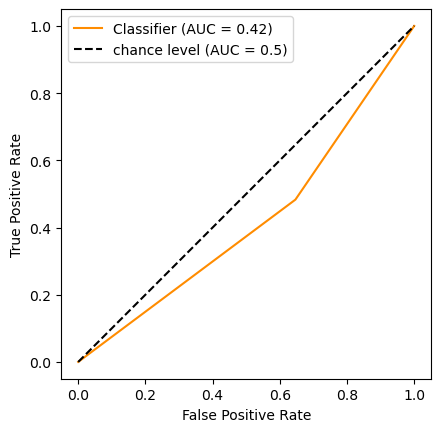

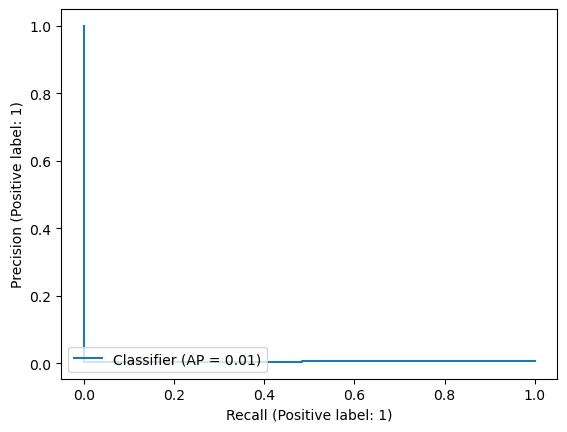

CPU times: user 35min 59s, sys: 15.3 s, total: 36min 14s
Wall time: 5min 47s


In [602]:
%%time

# 4. Model with SMOTE Data after Feature Selection and Hyperparameter Tuming

model = RandomForestClassifier(class_weight='balanced',
                               max_depth=None, 
                               min_samples_split=2, 
                               n_estimators=100,
                               random_state=4,
                               n_jobs=-1,
                               max_features="sqrt")
model.fit(X_train_rsmote, y_train_SMOTE)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

<div class="alert alert-block alert-warning">

**TASK 4: CHALLENGER MODELS: SUPPORT VECTOR MACHINE, LOGISTIC REGRESSION, and NEURAL NETWORK**
<div class="alert alert-block alert-warning">

**TASK 4.1: Support Vector Machine (SVM)**

              precision    recall  f1-score   support

           0       1.00      0.90      0.95    322254
           1       0.03      0.56      0.06      1915

    accuracy                           0.90    324169
   macro avg       0.51      0.73      0.50    324169
weighted avg       0.99      0.90      0.94    324169

ROC AUC SCORE: 0.73


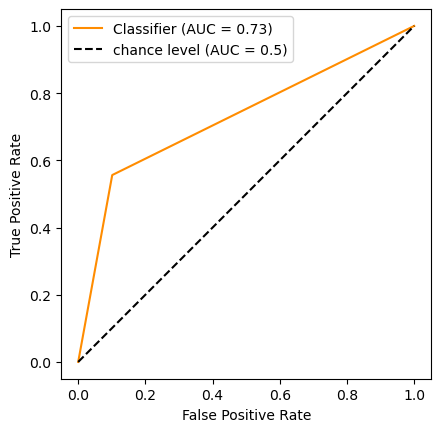

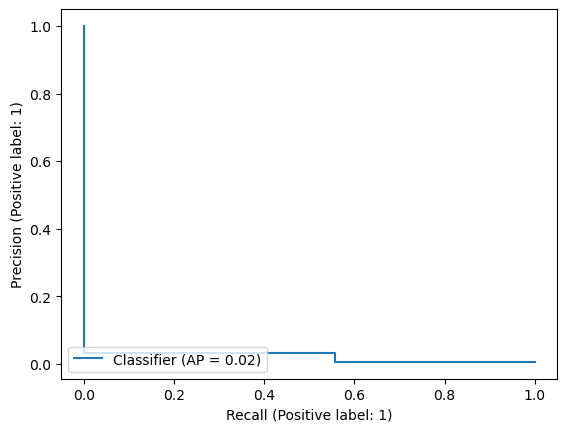

CPU times: user 10.3 s, sys: 506 ms, total: 10.8 s
Wall time: 10.6 s


In [318]:
%%time

# Model with Non-SMOTE data
model = SGDClassifier(random_state=0,n_jobs=-1)
model.fit(X_train_rs, y_train_ohe)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

              precision    recall  f1-score   support

           0       1.00      0.45      0.62    322254
           1       0.01      0.97      0.02      1915

    accuracy                           0.46    324169
   macro avg       0.51      0.71      0.32    324169
weighted avg       0.99      0.46      0.62    324169

ROC AUC SCORE: 0.71


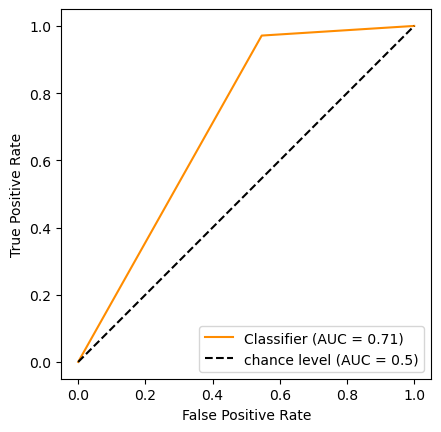

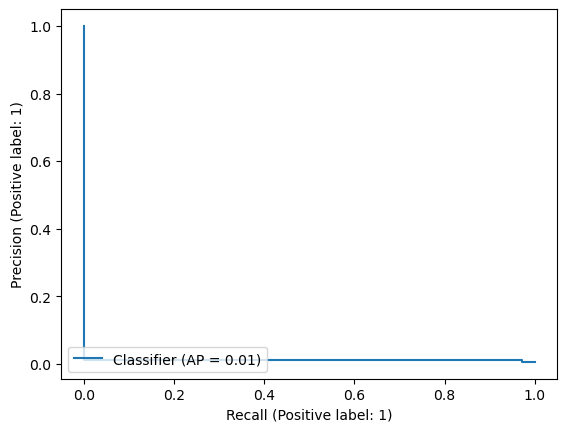

CPU times: user 10.7 s, sys: 3.69 s, total: 14.4 s
Wall time: 17.3 s


In [319]:
%%time

# Model with SMOTE data
model = SGDClassifier(random_state=0,n_jobs=-1)
model.fit(X_train_rsmote, y_train_SMOTE)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [437]:
# Model with Non-SMOTE data, feature selection, and hyperparameter tuning

# 1. Feature selection
model = SGDClassifier(loss='hinge',random_state=0,n_jobs=-1,max_iter=1000) 
cv = StratifiedKFold(5)

rfecv = RFECV(estimator=model, 
              step=1, 
              cv=cv, 
              scoring = 'recall', n_jobs=-1)

rfecv.fit(X_train_rs, y_train_ohe)

print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Features ranking: {rfecv.ranking_}")

Optimal number of features: 14
Features ranking: [1 1 1 1 1 1 1 2 1 4 1 1 1 1 1 3 1]


In [441]:
# 2. Dropping "state", city_population" and "distance_from_home" from both train and validation sets

X_train_svm_rs = np.delete(X_train_rs, [7,9,15], 1)
print(X_train_svm_rs.shape)

X_valid_svm_rs = np.delete(X_valid_rs, [7,9,15], 1)

(972506, 14)


In [580]:
%%time

# Given the feature selection results, we'll only keep optimal features and run a grid search for optimal paramter

# 3. Grid search
classifier = SGDClassifier(loss='hinge',random_state=0,penalty='elasticnet',n_jobs=-1,max_iter=5000,class_weight='balanced') 
cv = StratifiedKFold(5)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'alpha':[0.3,0.0001,0.5]},
                      scoring='recall', cv=cv, verbose=5, n_jobs=-1)

CV_rfc.fit(X_train_svm_rs, y_train_ohe)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

Fitting 5 folds for each of 3 candidates, totalling 15 fits
The best estimator is: SGDClassifier(alpha=0.5, class_weight='balanced', max_iter=5000, n_jobs=-1,
              penalty='elasticnet', random_state=0)
The best parameters are: {'alpha': 0.5}
The best score is: 0.9021753066643645
CPU times: user 2.21 s, sys: 1.2 s, total: 3.41 s
Wall time: 4min 58s


              precision    recall  f1-score   support

           0       1.00      0.76      0.86    322254
           1       0.02      0.93      0.04      1915

    accuracy                           0.76    324169
   macro avg       0.51      0.85      0.45    324169
weighted avg       0.99      0.76      0.86    324169

ROC AUC SCORE: 0.85


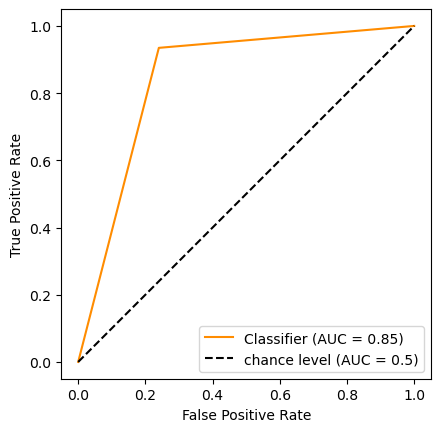

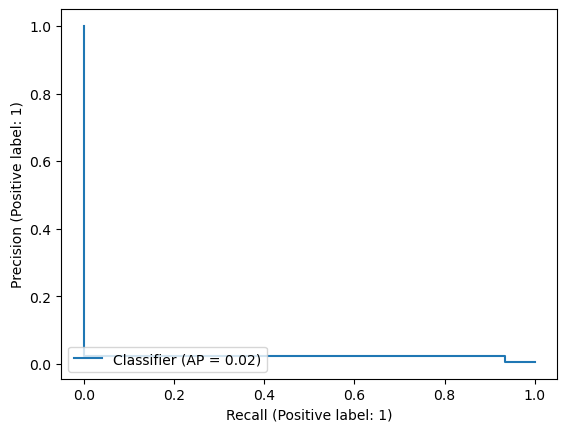

CPU times: user 3.23 s, sys: 462 ms, total: 3.69 s
Wall time: 3.35 s


In [588]:
%%time

# 4. Model with Non-SMOTE data, feature selection, and hyperparameter tuning
model = SGDClassifier(alpha=0.5, class_weight='balanced', penalty='elasticnet', max_iter=5000, n_jobs=-1, random_state=0)
model.fit(X_train_svm_rs, y_train_ohe)
predicted = model.predict(X_valid_svm_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [468]:
# Model with SMOTE data, feature selection, and hyperparameter tuning

# 1. Feature selection
model = SGDClassifier(loss='hinge',random_state=0,n_jobs=-1,max_iter=1000) 
cv = StratifiedKFold(5)

rfecv = RFECV(estimator=model, 
              step=1, 
              cv=cv, 
              scoring = 'recall', n_jobs=-1)

rfecv.fit(X_train_rsmote, y_train_SMOTE)

print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Features ranking: {rfecv.ranking_}")

[CV 3/5] END .........................alpha=0.3;, score=0.945 total time= 4.0min
[CV 3/5] END .......................alpha=0.001;, score=0.783 total time=  37.1s
Optimal number of features: 12
Features ranking: [1 1 1 1 6 3 1 4 5 2 1 1 1 1 1 1 1]


In [469]:
# 2. Dropping "gender_1", "gender_2", "state", "zip_code", and "city_population" from both train and validation sets

X_train_svm_SMOTE = np.delete(X_train_rsmote, [4,5,7,8,9], 1)
print(X_train_svm_SMOTE.shape)

X_valid_svm_SMOTE = np.delete(X_valid_rs, [4,5,7,8,9], 1)

(1933830, 12)
[CV 2/5] END .......................alpha=0.001;, score=0.957 total time=  35.3s
[CV 5/5] END .........................alpha=0.5;, score=0.830 total time=   2.5s
[CV 1/5] END .........................alpha=0.3;, score=0.847 total time=   3.9s
[CV 1/5] END .........................alpha=0.5;, score=0.840 total time=   3.3s
[CV 2/5] END .........................alpha=0.5;, score=0.996 total time= 3.7min
[CV 4/5] END .........................alpha=0.3;, score=0.861 total time=   3.5s
[CV 4/5] END .......................alpha=0.001;, score=0.945 total time=  31.5s
[CV 4/5] END .........................alpha=0.5;, score=0.861 total time=   2.5s
[CV 2/5] END .........................alpha=0.3;, score=0.976 total time= 4.2min
[CV 1/5] END .......................alpha=0.001;, score=0.917 total time=  18.2s
[CV 3/5] END .........................alpha=0.5;, score=0.984 total time= 3.3min


In [474]:
%%time

# Given the feature selection results, we'll only keep optimal features and run a grid search for optimal paramter

# 3. Grid search
classifier = SGDClassifier(loss='hinge',random_state=0,n_jobs=-1,max_iter=1000,class_weight='balanced') 
cv = StratifiedKFold(5)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'alpha':[0.000001,0.00001,0.0000001]},
                      scoring='recall', cv=cv, n_jobs=-1)

CV_rfc.fit(X_train_svm_SMOTE, y_train_SMOTE)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

The best estimator is: SGDClassifier(alpha=1e-06, class_weight='balanced', n_jobs=-1, random_state=0)
The best parameters are: {'alpha': 1e-06}
The best score is: 0.8842555964071298
CPU times: user 10.6 s, sys: 572 ms, total: 11.1 s
Wall time: 1min 28s


              precision    recall  f1-score   support

           0       1.00      0.45      0.62    322254
           1       0.01      0.98      0.02      1915

    accuracy                           0.45    324169
   macro avg       0.51      0.71      0.32    324169
weighted avg       0.99      0.45      0.61    324169

ROC AUC SCORE: 0.71


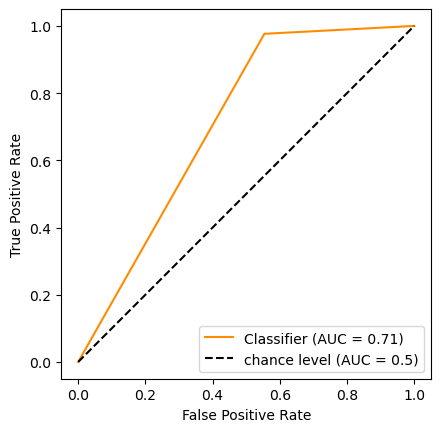

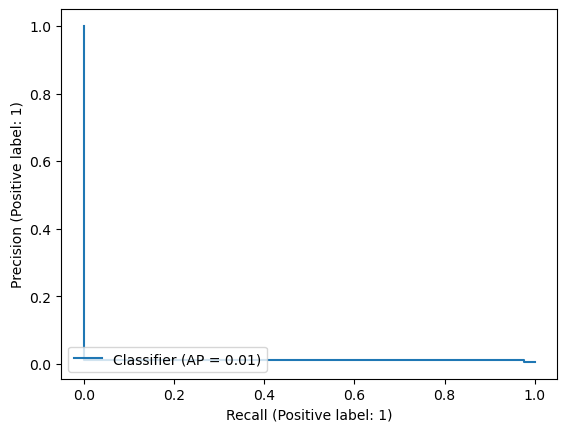

CPU times: user 11.5 s, sys: 315 ms, total: 11.8 s
Wall time: 11.4 s


In [471]:
%%time

# 4. Model with SMOTE data, feature selection, and hyperparameter tuning

model = SGDClassifier(alpha=1e-06,class_weight='balanced', n_jobs=-1,random_state=0)
model.fit(X_train_svm_SMOTE, y_train_SMOTE)
predicted = model.predict(X_valid_svm_SMOTE)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

**TASK 4.2: Logistic Regression**

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    322254
           1       0.74      0.32      0.45      1915

    accuracy                           1.00    324169
   macro avg       0.87      0.66      0.72    324169
weighted avg       0.99      1.00      0.99    324169

ROC AUC SCORE: 0.66


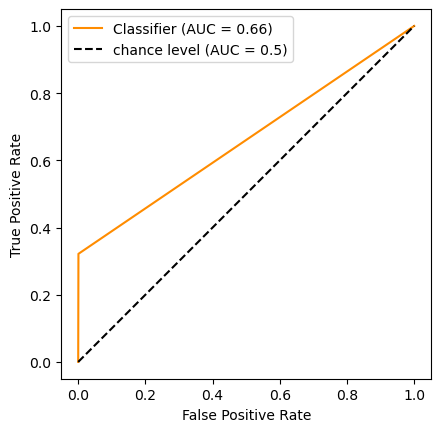

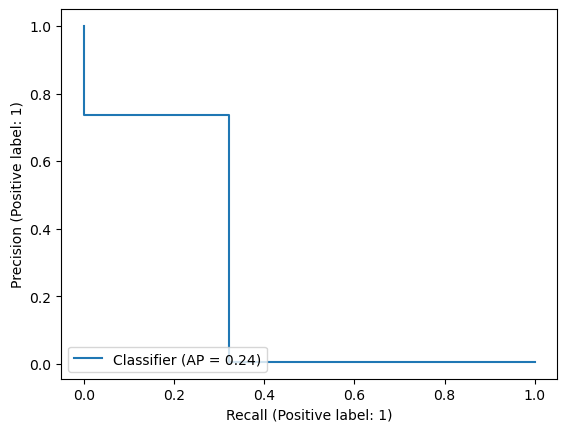

CPU times: user 1.68 s, sys: 505 ms, total: 2.18 s
Wall time: 35.9 s


In [345]:
%%time

# Model with Non-SMOTE data
model = LogisticRegression(random_state=2,n_jobs=-1,max_iter=1000)
model.fit(X_train_rs, y_train_ohe)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

              precision    recall  f1-score   support

           0       1.00      0.48      0.64    322254
           1       0.01      0.97      0.02      1915

    accuracy                           0.48    324169
   macro avg       0.51      0.72      0.33    324169
weighted avg       0.99      0.48      0.64    324169

ROC AUC SCORE: 0.72


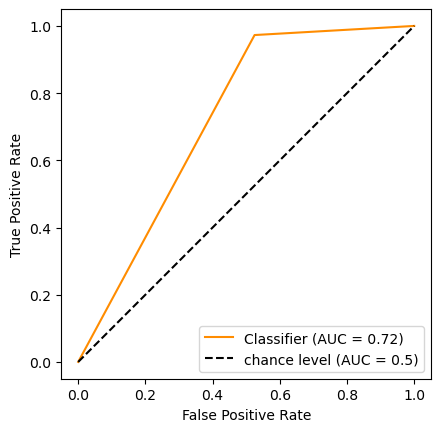

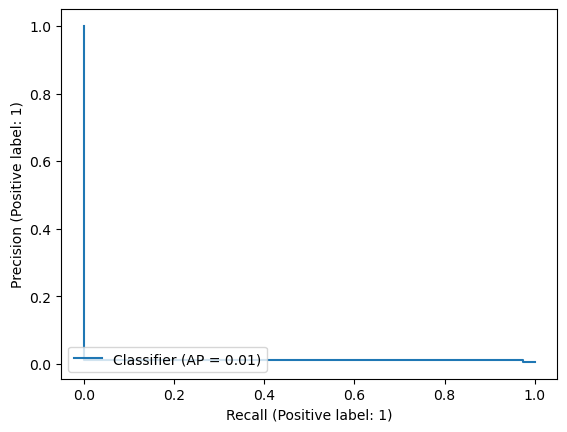

CPU times: user 2.09 s, sys: 630 ms, total: 2.72 s
Wall time: 32.6 s


In [346]:
%%time

# Model with SMOTE data
model = LogisticRegression(random_state=2,n_jobs=-1,max_iter=1000)
model.fit(X_train_rsmote, y_train_SMOTE)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [475]:
# Model with Non-SMOTE data, feature selection, and hyperparameter tuning

# 1. Feature selection
model = LogisticRegression(random_state=2,n_jobs=-1,max_iter=1000) 
cv = StratifiedKFold(5)

rfecv = RFECV(estimator=model, 
              step=1, 
              cv=cv, 
              scoring = 'recall', n_jobs=-1)

rfecv.fit(X_train_rs, y_train_ohe)

print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Features ranking: {rfecv.ranking_}")

Optimal number of features: 14
Features ranking: [1 1 1 1 1 1 2 3 1 4 1 1 1 1 1 1 1]


In [170]:
# Checking names of columns
X_train_hnte.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 972506 entries, 0 to 972505
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   credit_card_number  972506 non-null  float64
 1   merchant            972506 non-null  float64
 2   category            972506 non-null  float64
 3   amount(usd)         972506 non-null  float64
 4   gender_1            972506 non-null  float64
 5   gender_2            972506 non-null  float64
 6   city                972506 non-null  float64
 7   state               972506 non-null  float64
 8   zip_code            972506 non-null  float64
 9   city_population     972506 non-null  float64
 10  job                 972506 non-null  float64
 11  hour_of_day_cat     972506 non-null  float64
 12  month_cat           972506 non-null  float64
 13  velocity            972506 non-null  float64
 14  age                 972506 non-null  float64
 15  distance_from_home  972506 non-nul

In [477]:
2. # Dropping "city", "state" and "city_population" from both train and validation sets

X_train_logistic_rs = np.delete(X_train_rs, [6,7,9], 1)
print(X_train_logistic_rs.shape)

X_valid_logistic_rs = np.delete(X_valid_rs, [6,7,9], 1)

(972506, 14)


In [484]:
%%time

# Given the feature selection results, we'll only keep optimal features and run a grid search for optimal paramters

# 3. Grid search
classifier = LogisticRegression(random_state=2,n_jobs=-1,max_iter=1000,class_weight='balanced') 
cv = StratifiedKFold(5)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'C':[1000,10000]},
                      scoring='recall', cv=cv, verbose=5, n_jobs=-1)

CV_rfc.fit(X_train_logistic_rs, y_train_ohe)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

Fitting 5 folds for each of 2 candidates, totalling 10 fits
The best estimator is: LogisticRegression(C=1000, class_weight='balanced', max_iter=1000, n_jobs=-1,
                   random_state=2)
The best parameters are: {'C': 1000}
The best score is: 0.854051582600744
CPU times: user 324 ms, sys: 416 ms, total: 740 ms
Wall time: 1min 11s


              precision    recall  f1-score   support

           0       1.00      0.85      0.92    322254
           1       0.03      0.88      0.06      1915

    accuracy                           0.85    324169
   macro avg       0.52      0.87      0.49    324169
weighted avg       0.99      0.85      0.91    324169

ROC AUC SCORE: 0.87


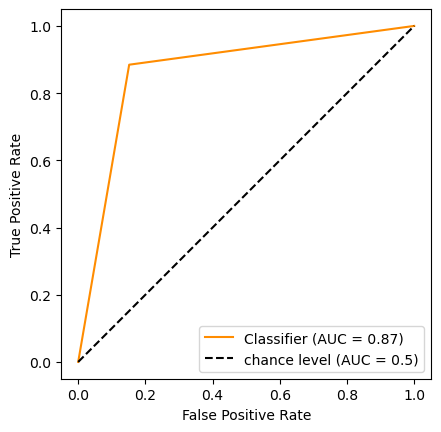

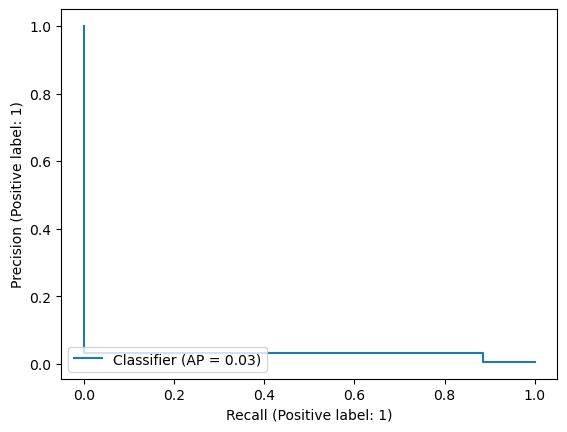

CPU times: user 1.99 s, sys: 3.05 s, total: 5.04 s
Wall time: 24.3 s


In [481]:
%%time

# 4. New Non-SMOTE model performance after feature selection and hyperparameter tuning
model = LogisticRegression(C=1000, class_weight='balanced', max_iter=1000, n_jobs=-1, random_state=2)
model.fit(X_train_logistic_rs, y_train_ohe)
predicted = model.predict(X_valid_logistic_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [476]:
%%time

# Model with SMOTE data, feature selection, and hyperparameter tuning

# 1. Feature selection
model = LogisticRegression(random_state=2,n_jobs=-1,max_iter=1000) 
cv = StratifiedKFold(5)

rfecv = RFECV(estimator=model, 
              step=1, 
              cv=cv, 
              scoring = 'recall', n_jobs=-1)

rfecv.fit(X_train_rsmote, y_train_SMOTE)

print(f"Optimal number of features: {rfecv.n_features_}")
print(f"Features ranking: {rfecv.ranking_}")

Optimal number of features: 5
Features ranking: [ 1  5  2  1  9  8  3 10 12 13  7  1  1  1  6 11  4]
CPU times: user 3.22 s, sys: 3.47 s, total: 6.7 s
Wall time: 4min 2s


In [485]:
# 2. Dropping "merchant", "category", "gender_1", "gender_2","city","state","zip_code","city_population","job","age","distance_from_home","full_name"
X_train_logistic_smote = np.delete(X_train_rsmote,[1,2,4,5,6,7,8,9,10,14,15,16], 1)
print(X_train_logistic_smote.shape)
X_valid_logistic_smote = np.delete(X_valid_rs,[1,2,4,5,6,7,8,9,10,14,15,16], 1)

(1933830, 5)


In [494]:
%%time

# Given the feature selection results, we'll only keep optimal features and run a grid search for optimal paramter

# 3. Grid search
classifier = LogisticRegression(random_state=2,n_jobs=-1,max_iter=1000,class_weight='balanced') 
cv = StratifiedKFold(5)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'C':[20,25,30]},
                      scoring='recall', cv=cv, n_jobs=-1)

CV_rfc.fit(X_train_logistic_smote, y_train_SMOTE)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

The best estimator is: LogisticRegression(C=25, class_weight='balanced', max_iter=1000, n_jobs=-1,
                   random_state=2)
The best parameters are: {'C': 25}
The best score is: 0.8785032810536604
CPU times: user 395 ms, sys: 289 ms, total: 684 ms
Wall time: 12.2 s


              precision    recall  f1-score   support

           0       1.00      0.49      0.65    322254
           1       0.01      0.97      0.02      1915

    accuracy                           0.49    324169
   macro avg       0.51      0.73      0.34    324169
weighted avg       0.99      0.49      0.65    324169

ROC AUC SCORE: 0.73


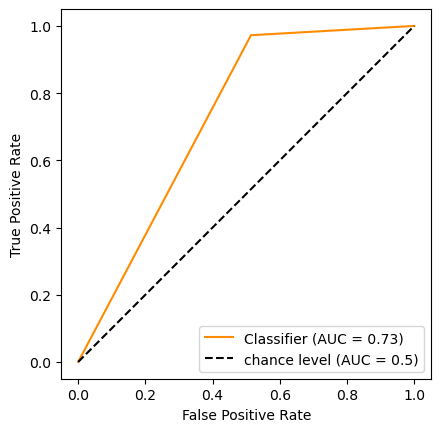

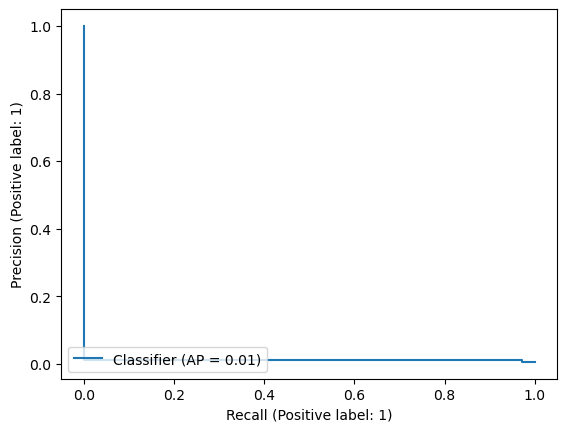

CPU times: user 1.4 s, sys: 243 ms, total: 1.64 s
Wall time: 4.66 s


In [495]:
%%time

# 4. Model with SMOTE data, feature selection, and hyperparameter tuning
model = LogisticRegression(C=25, class_weight='balanced', max_iter=1000, n_jobs=-1, random_state=2)
model.fit(X_train_logistic_smote, y_train_SMOTE)
predicted = model.predict(X_valid_logistic_smote)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

**TASK 4.3: Neural Network**

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    322254
           1       0.66      0.74      0.70      1915

    accuracy                           1.00    324169
   macro avg       0.83      0.87      0.85    324169
weighted avg       1.00      1.00      1.00    324169

ROC AUC SCORE: 0.87


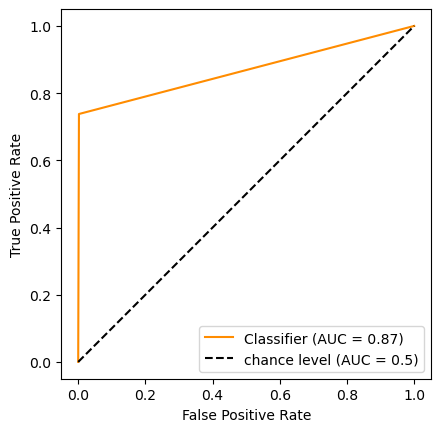

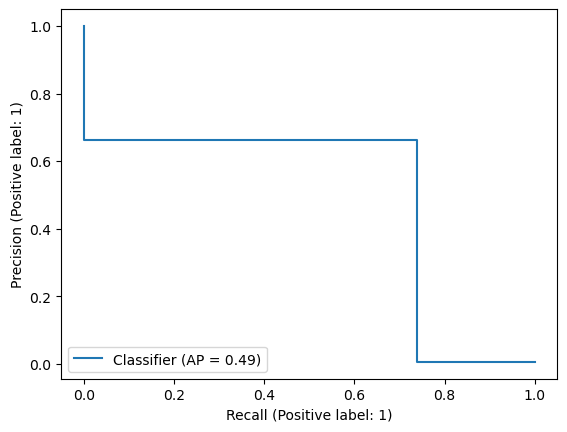

CPU times: user 23min 40s, sys: 21.4 s, total: 24min 2s
Wall time: 6min 10s


In [349]:
%%time

# Model with Non-SMOTE data
model = MLPClassifier(random_state=7)
model.fit(X_train_rs, y_train_ohe)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

              precision    recall  f1-score   support

           0       0.99      0.81      0.89    322254
           1       0.00      0.01      0.00      1915

    accuracy                           0.81    324169
   macro avg       0.50      0.41      0.45    324169
weighted avg       0.99      0.81      0.89    324169

ROC AUC SCORE: 0.41


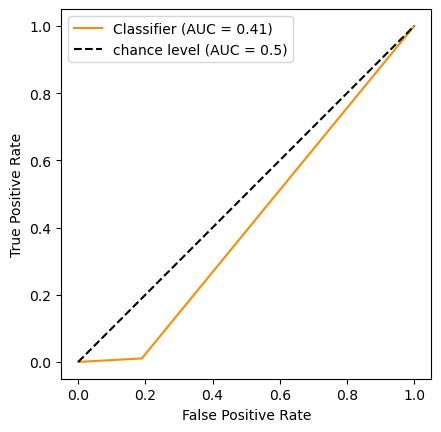

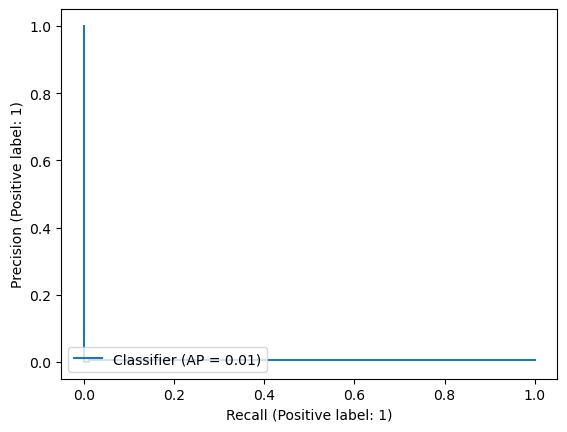

CPU times: user 1h 11min 15s, sys: 1min 21s, total: 1h 12min 37s
Wall time: 19min 17s


In [350]:
%%time

# Model with SMOTE data
model = MLPClassifier(random_state=7)
model.fit(X_train_rsmote, y_train_SMOTE)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [582]:
%%time

# Grid search for non-SMOTE model (hyperparameter tuning)
classifier = MLPClassifier(random_state=7,verbose=True,early_stopping=True)
cv = StratifiedKFold(3)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'hidden_layer_sizes':[(100,),(200,),(300,)]},
                      scoring='recall', cv=cv, verbose=5, n_jobs=-1)

CV_rfc.fit(X_train_rs, y_train_ohe)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

Fitting 3 folds for each of 2 candidates, totalling 6 fits
Iteration 1, loss = 0.02260844
Validation score: 0.996144
Iteration 2, loss = 0.01606870
Validation score: 0.996267
Iteration 3, loss = 0.01484778
Validation score: 0.996350
Iteration 4, loss = 0.01389503
Validation score: 0.996771
Iteration 5, loss = 0.01321499
Validation score: 0.996802
Iteration 6, loss = 0.01268721
Validation score: 0.996895
Iteration 7, loss = 0.01226677
Validation score: 0.996905
Iteration 8, loss = 0.01190080
Validation score: 0.996812
Iteration 1, loss = 0.04931360
Validation score: 0.995943
Iteration 2, loss = 0.01948184
Validation score: 0.996391
Iteration 3, loss = 0.01757901
Validation score: 0.996406
Iteration 4, loss = 0.01710326
Validation score: 0.996499
Iteration 5, loss = 0.01692595
Validation score: 0.996422
Iteration 6, loss = 0.01685066
Validation score: 0.996375
Iteration 7, loss = 0.01680782
Validation score: 0.996545
Iteration 8, loss = 0.01679011
Validation score: 0.996468
Iteration 9, 

Iteration 30, loss = 0.00954948
Validation score: 0.997491
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
The best estimator is: MLPClassifier(early_stopping=True, hidden_layer_sizes=(200,), random_state=7,
              verbose=True)
The best parameters are: {'hidden_layer_sizes': (200,)}
The best score is: 0.6031053679168998
CPU times: user 18min 9s, sys: 16.3 s, total: 18min 26s
Wall time: 9min 44s


Iteration 1, loss = 0.02260844
Validation score: 0.996144
Iteration 2, loss = 0.01606870
Validation score: 0.996267
Iteration 3, loss = 0.01484778
Validation score: 0.996350
Iteration 4, loss = 0.01389503
Validation score: 0.996771
Iteration 5, loss = 0.01321499
Validation score: 0.996802
Iteration 6, loss = 0.01268721
Validation score: 0.996895
Iteration 7, loss = 0.01226677
Validation score: 0.996905
Iteration 8, loss = 0.01190080
Validation score: 0.996812
Iteration 9, loss = 0.01166706
Validation score: 0.996740
Iteration 10, loss = 0.01143725
Validation score: 0.996802
Iteration 11, loss = 0.01125973
Validation score: 0.997059
Iteration 12, loss = 0.01108507
Validation score: 0.997152
Iteration 13, loss = 0.01096784
Validation score: 0.997162
Iteration 14, loss = 0.01079544
Validation score: 0.996843
Iteration 15, loss = 0.01070698
Validation score: 0.997152
Iteration 16, loss = 0.01058343
Validation score: 0.997265
Iteration 17, loss = 0.01051849
Validation score: 0.997152
Iterat

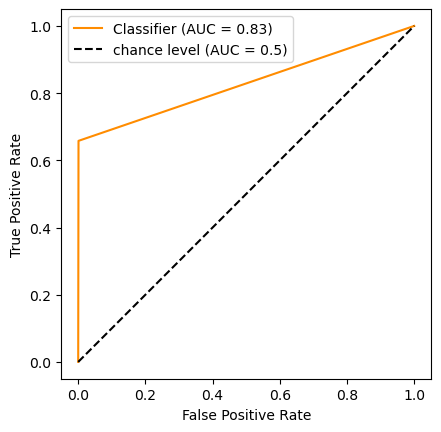

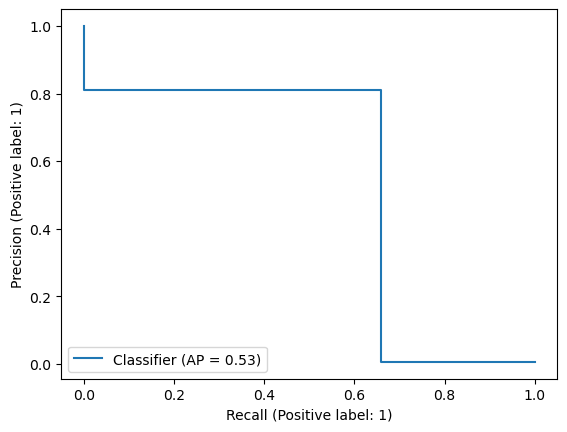

CPU times: user 17min 16s, sys: 18.9 s, total: 17min 35s
Wall time: 4min 37s


In [608]:
%%time

# Model with non-SMOTE data and hyperparameter tuning
model = MLPClassifier(early_stopping=True, hidden_layer_sizes=(200,), random_state=7, verbose=True)
model.fit(X_train_rs, y_train_ohe)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

In [581]:
%%time

# Grid search for SMOTE model (hyperparameter tuning)
classifier = MLPClassifier(alpha=0.6,random_state=7,verbose=True,learning_rate='adaptive',early_stopping=True)
cv = StratifiedKFold(3)

CV_rfc = GridSearchCV(classifier, 
                      param_grid={'hidden_layer_sizes':[(200,),(500,),(800,),(100,)]},
                      scoring='recall', cv=cv, verbose=5, n_jobs=-1)

CV_rfc.fit(X_train_rsmote, y_train_SMOTE)

print(f'The best estimator is: {CV_rfc.best_estimator_}')
print(f'The best parameters are: {CV_rfc.best_params_}')
print(f'The best score is: {CV_rfc.best_score_}')

Fitting 3 folds for each of 2 candidates, totalling 6 fits
[CV 3/5] END ......................alpha=0.0001;, score=0.812 total time= 1.2min
[CV 4/5] END .........................alpha=0.3;, score=0.861 total time=  12.3s
[CV 1/5] END .........................alpha=0.5;, score=0.840 total time=   8.0s
[CV 2/5] END .........................alpha=0.5;, score=0.996 total time= 4.0min
[CV 2/5] END ......................alpha=0.0001;, score=0.962 total time= 1.2min
Iteration 1, loss = 0.28224669
Validation score: 0.906657
Iteration 2, loss = 0.24418142
Validation score: 0.917640
Iteration 3, loss = 0.23765051
Validation score: 0.920999
Iteration 4, loss = 0.23563183
Validation score: 0.921301
Iteration 5, loss = 0.23466975
Validation score: 0.922364
Iteration 6, loss = 0.23310890
Validation score: 0.922519
Iteration 7, loss = 0.23190715
Validation score: 0.923209
Iteration 8, loss = 0.23107906
Validation score: 0.923597
Iteration 9, loss = 0.23088507
Validation score: 0.924419
Iteration 10, 

[CV 2/5] END .........................alpha=0.3;, score=0.978 total time= 4.8min
Iteration 1, loss = 0.22939593
Validation score: 0.937133
Iteration 2, loss = 0.21881735
Validation score: 0.938226
Iteration 3, loss = 0.21753969
Validation score: 0.939064
Iteration 4, loss = 0.21714562
Validation score: 0.939770
Iteration 5, loss = 0.21671368
Validation score: 0.939304
Iteration 6, loss = 0.21646797
Validation score: 0.938094
Iteration 7, loss = 0.21639247
Validation score: 0.939498
Iteration 8, loss = 0.21617208
Validation score: 0.939095
Iteration 9, loss = 0.21608922
Validation score: 0.940274
Iteration 10, loss = 0.21601699
Validation score: 0.939677
Iteration 11, loss = 0.21584306
Validation score: 0.936520
Iteration 12, loss = 0.21580193
Validation score: 0.937102
Iteration 13, loss = 0.21573397
Validation score: 0.940196
Iteration 14, loss = 0.21560060
Validation score: 0.939677
Iteration 15, loss = 0.21573494
Validation score: 0.940212
Iteration 16, loss = 0.21559056
Validation 

Iteration 1, loss = 0.22580180
Iteration 2, loss = 0.21797573
Iteration 3, loss = 0.21724719
Iteration 4, loss = 0.21687220
Iteration 5, loss = 0.21670091
Iteration 6, loss = 0.21642462
Iteration 7, loss = 0.21620805
Iteration 8, loss = 0.21619583
Iteration 9, loss = 0.21615796
Iteration 10, loss = 0.21601031
Iteration 11, loss = 0.21594620
Iteration 12, loss = 0.21584073
Iteration 13, loss = 0.21584742
Iteration 14, loss = 0.21587952
Iteration 15, loss = 0.21572374
Iteration 16, loss = 0.21572675
Iteration 17, loss = 0.21573555
Iteration 18, loss = 0.21570252
Iteration 19, loss = 0.21569014
Iteration 20, loss = 0.21556778
Iteration 21, loss = 0.21553264
Iteration 22, loss = 0.21557435
Iteration 23, loss = 0.21548616
Iteration 24, loss = 0.21549862
Iteration 25, loss = 0.21541557
Iteration 26, loss = 0.21544291
Iteration 27, loss = 0.21542656
Iteration 28, loss = 0.21541952
Iteration 29, loss = 0.21540288
Iteration 30, loss = 0.21545968
Iteration 31, loss = 0.21541898
Training loss did

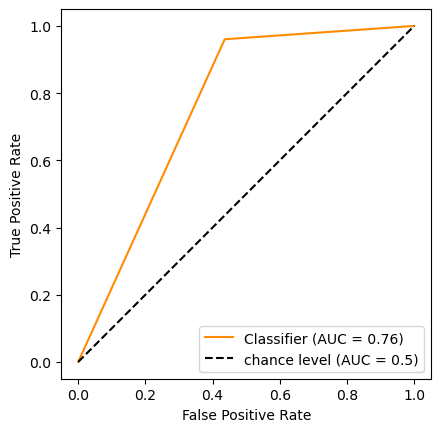

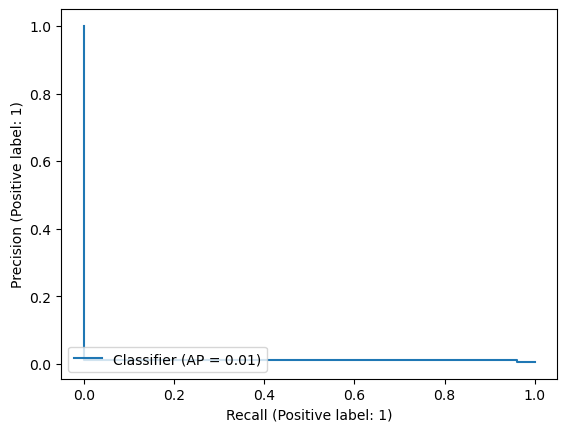

CPU times: user 43min 59s, sys: 50.2 s, total: 44min 49s
Wall time: 11min 27s


In [598]:
%%time

# Model with SMOTE data and hyperparameter tuning
model = MLPClassifier(alpha=0.6, hidden_layer_sizes=(800,), learning_rate='adaptive', random_state=7, verbose=True)
model.fit(X_train_rsmote, y_train_SMOTE)
predicted = model.predict(X_valid_rs)
print(classification_report(y_valid_ohe, predicted))
performance(y_valid_ohe, predicted)

<div class="alert alert-block alert-warning">

**TASK 5: FINAL MODEL SELECTION**
<div class="alert alert-block alert-warning">

              precision    recall  f1-score   support

           0       1.00      0.94      0.97    553574
           1       0.01      0.10      0.01      2145

    accuracy                           0.93    555719
   macro avg       0.50      0.52      0.49    555719
weighted avg       0.99      0.93      0.96    555719

ROC AUC SCORE: 0.52


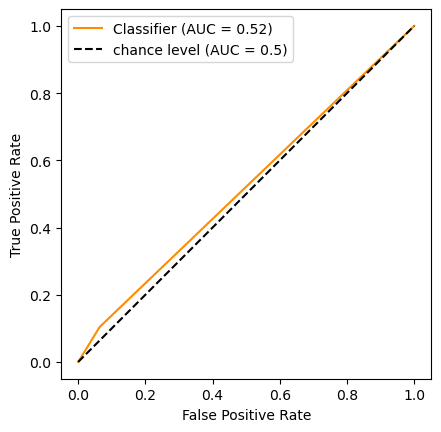

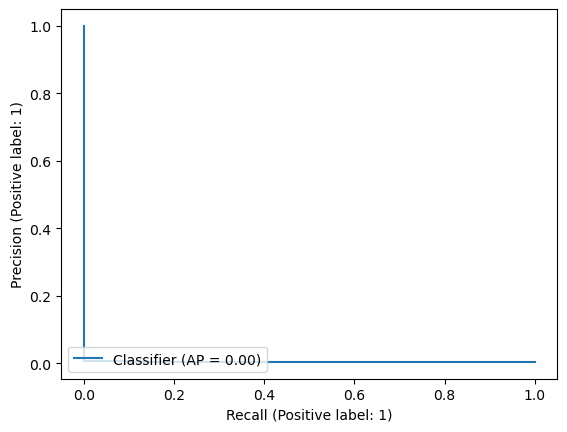

CPU times: user 2min 6s, sys: 3.03 s, total: 2min 10s
Wall time: 22 s


In [605]:
%%time

# Random forest model with 11 features and hyperparameter tuning

# Trimming the test set to the same number of features
X_test_rf_final = np.delete(X_test_rs, [4,5,7,9,12,15], 1)

# Fitting and predicting to the test set
model = RandomForestClassifier(class_weight='balanced',
                               max_depth=4,
                               n_estimators=60,
                               random_state=4,
                               n_jobs=-1,
                               min_samples_split=5,
                               max_features="sqrt",
                               min_samples_leaf=1,
                               bootstrap=True)
model.fit(X_rfns_trimmed, y_train_ohe)
predicted = model.predict(X_test_rf_final)
print(classification_report(y_test, predicted))
performance(y_test, predicted)

              precision    recall  f1-score   support

           0       1.00      0.76      0.86    553574
           1       0.01      0.92      0.03      2145

    accuracy                           0.76    555719
   macro avg       0.51      0.84      0.45    555719
weighted avg       1.00      0.76      0.86    555719

ROC AUC SCORE: 0.84


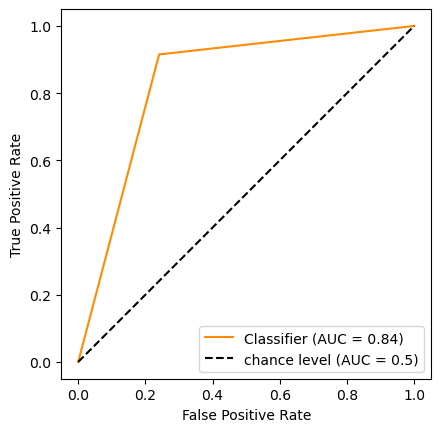

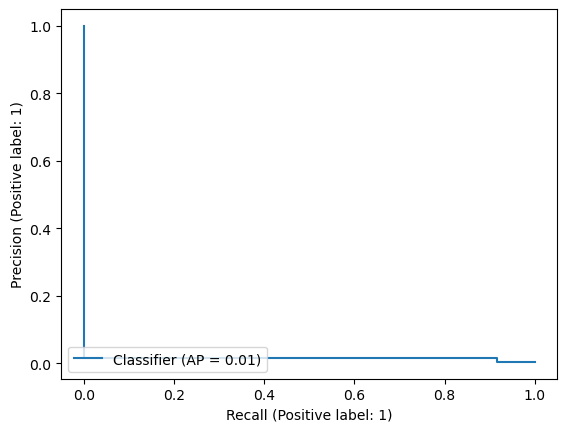

CPU times: user 3.85 s, sys: 602 ms, total: 4.45 s
Wall time: 4.47 s


In [609]:
%%time

# SVM model with Non-SMOTE data, feature selection, and hyperparameter tuning

# First narrowing down our test set to correct features
X_test_svm_final = np.delete(X_test_rs, [7,9,15], 1)

model = SGDClassifier(alpha=0.5, class_weight='balanced', penalty='elasticnet', max_iter=5000, n_jobs=-1, random_state=0)
model.fit(X_train_svm_rs, y_train_ohe)
predicted = model.predict(X_test_svm_final)
print(classification_report(y_test, predicted))
performance(y_test, predicted)

              precision    recall  f1-score   support

           0       1.00      0.85      0.92    553574
           1       0.02      0.81      0.04      2145

    accuracy                           0.85    555719
   macro avg       0.51      0.83      0.48    555719
weighted avg       1.00      0.85      0.91    555719

ROC AUC SCORE: 0.83


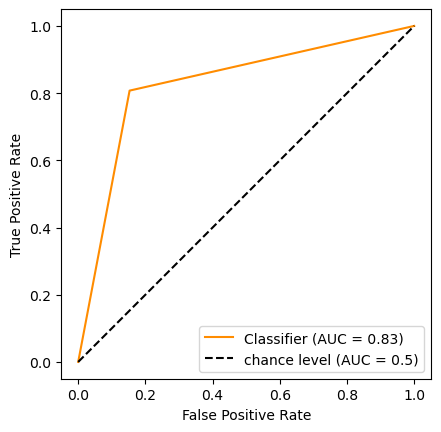

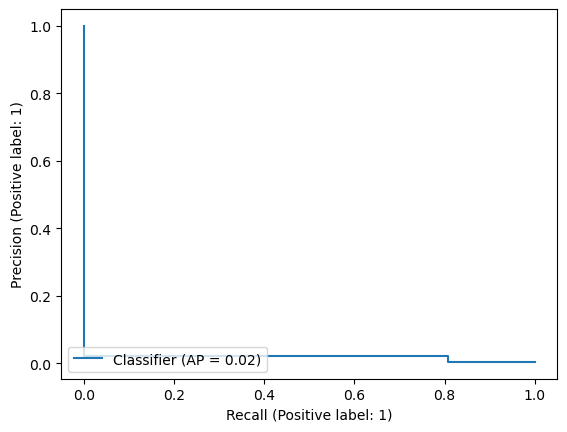

CPU times: user 1.83 s, sys: 927 ms, total: 2.75 s
Wall time: 22.1 s


In [611]:
%%time

# Logistic Non-SMOTE model after feature selection and hyperparameter tuning

# First narrowing down our test set to correct features
X_test_logistic_final = np.delete(X_test_rs, [6,7,9], 1)

model = LogisticRegression(C=1000, class_weight='balanced', max_iter=1000, n_jobs=-1, random_state=2)
model.fit(X_train_logistic_rs, y_train_ohe)
predicted = model.predict(X_test_logistic_final)
print(classification_report(y_test, predicted))
performance(y_test, predicted)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.07      0.10      0.08      2145

    accuracy                           0.99    555719
   macro avg       0.53      0.55      0.54    555719
weighted avg       0.99      0.99      0.99    555719

ROC AUC SCORE: 0.55


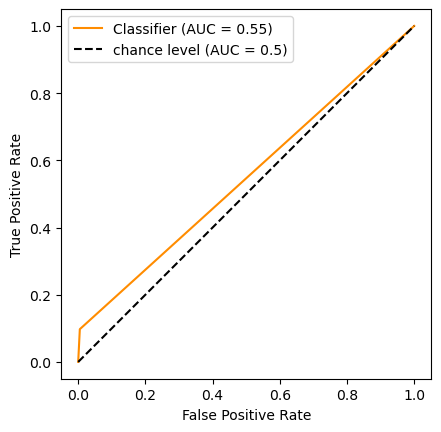

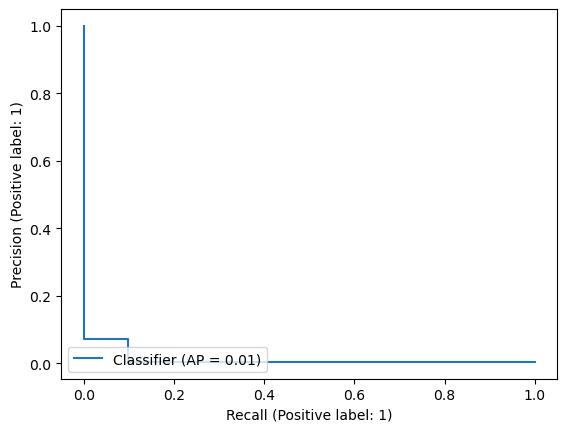

CPU times: user 24min 3s, sys: 23.4 s, total: 24min 26s
Wall time: 6min 14s


In [612]:
%%time

# Multi-layer perceptron model
model = MLPClassifier(random_state=7)
model.fit(X_train_rs, y_train_ohe)
predicted = model.predict(X_test_rs)
print(classification_report(y_test, predicted))
performance(y_test, predicted)

<div class="alert alert-block alert-warning">

**----- AN INVESTIGATION INTO WHY RANDOM FOREST AND MLP RESULTS TURNED OUT SO LOW -----**
<div class="alert alert-block alert-warning">

In [669]:
# Defining X_train, X_test, y_train, and y_test

X_train_new = training_set.drop(columns=["transaction_time","is_fraud","month","hour_of_day","street_apt_number"], axis=1)
y_train_new = training_set['is_fraud'].astype(int)
features_list_new = list(X_train_new.columns)
X_train_categorical_new = training_set[["credit_card_number","merchant","category","gender","city","state","zip_code","job","hour_of_day_cat","full_name"]]
cat_features_new = list(X_train_categorical_new.columns)
X_test_new = test_set[features_list_new]
y_test_new = test_set['is_fraud'].astype(int)
print(X_train_new.info())
print(y_train_new.info())
print(y_test_new.info())

X_wow_train = X_train_new
y_wow_train = y_train_new

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 16 columns):
 #   Column              Non-Null Count    Dtype   
---  ------              --------------    -----   
 0   credit_card_number  1296675 non-null  category
 1   merchant            1296675 non-null  category
 2   category            1296675 non-null  category
 3   amount(usd)         1296675 non-null  float64 
 4   gender              1296675 non-null  category
 5   city                1296675 non-null  category
 6   state               1296675 non-null  category
 7   zip_code            1296675 non-null  category
 8   city_population     1296675 non-null  int64   
 9   job                 1296675 non-null  category
 10  hour_of_day_cat     1296675 non-null  category
 11  month_cat           1296675 non-null  category
 12  velocity            1296675 non-null  float64 
 13  age                 1296675 non-null  int64   
 14  distance_from_home  1296675 non-null  float64 
 15

In [671]:
# One-Hot Encoding "gender" variables

ohe1 = OneHotEncoder(cols=['gender'], handle_unknown='error').fit(X_train_new, y_train_new)
X_train_wow_new = ohe1.transform(X_train_new)
print(X_train_wow_new.info())

ohe2 = OneHotEncoder(cols=['gender'], handle_unknown='error').fit(X_test_new, y_test_new)
X_test_wow_new = ohe2.transform(X_test_new)
print(X_test_wow_new.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 17 columns):
 #   Column              Non-Null Count    Dtype   
---  ------              --------------    -----   
 0   credit_card_number  1296675 non-null  category
 1   merchant            1296675 non-null  category
 2   category            1296675 non-null  category
 3   amount(usd)         1296675 non-null  float64 
 4   gender_1            1296675 non-null  int64   
 5   gender_2            1296675 non-null  int64   
 6   city                1296675 non-null  category
 7   state               1296675 non-null  category
 8   zip_code            1296675 non-null  category
 9   city_population     1296675 non-null  int64   
 10  job                 1296675 non-null  category
 11  hour_of_day_cat     1296675 non-null  category
 12  month_cat           1296675 non-null  category
 13  velocity            1296675 non-null  float64 
 14  age                 1296675 non-null  int64   
 15

In [672]:
# Further splitting onehotencoded X_train and y_train into a validation X and Y set

X_train_new1, X_valid_new1, y_train_new1, y_valid_new1 = train_test_split(X_train_wow_new, y_train_new, shuffle=False)
print(f'{X_train_new1.info()}')
print(f'{X_valid_new1.info()}')
print(f'{y_train_new1.shape}')
print(f'{y_valid_new1.shape}')
X_train_new1.head(10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 972506 entries, 0 to 972505
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype   
---  ------              --------------   -----   
 0   credit_card_number  972506 non-null  category
 1   merchant            972506 non-null  category
 2   category            972506 non-null  category
 3   amount(usd)         972506 non-null  float64 
 4   gender_1            972506 non-null  int64   
 5   gender_2            972506 non-null  int64   
 6   city                972506 non-null  category
 7   state               972506 non-null  category
 8   zip_code            972506 non-null  category
 9   city_population     972506 non-null  int64   
 10  job                 972506 non-null  category
 11  hour_of_day_cat     972506 non-null  category
 12  month_cat           972506 non-null  category
 13  velocity            972506 non-null  float64 
 14  age                 972506 non-null  int64   
 15  distance_from_hom

,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,1,0,Moravian Falls,NC,28654,3495,"Psychologist, counselling",A,A,0.0,31,48.947783,JenniferBanks
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,1,0,Orient,WA,99160,149,Special educational needs teacher,A,A,0.0,41,18.775736,StephanieGill
2,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,0,1,Malad City,ID,83252,4154,Nature conservation officer,A,A,0.0,57,67.172035,EdwardSanchez
3,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,0,1,Boulder,MT,59632,1939,Patent attorney,A,A,0.0,52,59.455974,JeremyWhite
4,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,0,1,Doe Hill,VA,24433,99,Dance movement psychotherapist,A,A,0.0,33,48.282030,TylerGarcia
5,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,1,0,Dublin,PA,18917,2158,Transport planner,A,A,0.0,58,53.498418,JenniferConner
6,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,1,0,Holcomb,KS,67851,2691,Arboriculturist,A,A,0.0,26,73.380741,KelseyRichards
7,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,0,1,Edinburg,VA,22824,6018,"Designer, multimedia",A,A,0.0,72,7.925412,StevenWilliams
8,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,1,0,Manor,PA,15665,1472,Public affairs consultant,A,A,0.0,78,15.741745,HeatherChase
9,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,1,0,Clarksville,TN,37040,151785,Pathologist,A,A,0.0,45,45.944008,MelissaAguilar


In [674]:
%%time

# First hot encoding, then
# Target encoding the categorical variables using a stratified k-fold nested cross-validation approach to reduce overfitting

HNTE_encoder = NestedCVWrapper((TargetEncoder)(min_samples_leaf=20, smoothing=10),cv=5,random_state=21)
X_train_finalnew, X_valid_finalnew, X_test_finalnew = HNTE_encoder.fit_transform(X_train_new1, y_train_new1, X_test=(X_valid_new1, X_test_wow_new))
print(X_train_finalnew.info())
X_train_finalnew.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 972506 entries, 0 to 972505
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   credit_card_number  972506 non-null  float64
 1   merchant            972506 non-null  float64
 2   category            972506 non-null  float64
 3   amount(usd)         972506 non-null  float64
 4   gender_1            972506 non-null  float64
 5   gender_2            972506 non-null  float64
 6   city                972506 non-null  float64
 7   state               972506 non-null  float64
 8   zip_code            972506 non-null  float64
 9   city_population     972506 non-null  float64
 10  job                 972506 non-null  float64
 11  hour_of_day_cat     972506 non-null  float64
 12  month_cat           972506 non-null  float64
 13  velocity            972506 non-null  float64
 14  age                 972506 non-null  float64
 15  distance_from_home  972506 non-nul

,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name
0,0.000000e+00,0.016883,0.014187,4.97,1.0,0.0,0.000000e+00,0.004613,0.000000e+00,3495.0,1.833181e-03,0.014842,0.008014,0.0,31.0,48.947783,0.000000e+00
1,0.000000e+00,0.009855,0.013782,107.23,1.0,0.0,0.000000e+00,0.005230,0.000000e+00,149.0,2.962475e-03,0.014842,0.008014,0.0,41.0,18.775736,0.000000e+00
2,1.179847e-14,0.003571,0.002325,220.11,0.0,1.0,1.179847e-14,0.003318,1.179847e-14,4154.0,1.179847e-14,0.015330,0.008021,0.0,57.0,67.172035,1.179847e-14
3,2.666667e-02,0.005165,0.004622,45.00,0.0,1.0,2.666667e-02,0.002977,2.666667e-02,1939.0,7.447529e-03,0.014709,0.008205,0.0,52.0,59.455974,2.666667e-02
4,0.000000e+00,0.003205,0.003035,41.96,0.0,1.0,0.000000e+00,0.005819,0.000000e+00,99.0,0.000000e+00,0.014842,0.008014,0.0,33.0,48.282030,0.000000e+00
5,1.765671e-16,0.003608,0.004708,94.63,1.0,0.0,1.765671e-16,0.005522,1.765671e-16,2158.0,0.000000e+00,0.014382,0.008196,0.0,58.0,53.498418,1.765671e-16
6,9.677419e-03,0.003604,0.002948,44.54,1.0,0.0,9.677419e-03,0.003808,9.677419e-03,2691.0,8.025682e-03,0.015304,0.007941,0.0,26.0,73.380741,9.677419e-03
7,1.176471e-02,0.005559,0.004459,71.65,0.0,1.0,1.176471e-02,0.006210,1.176471e-02,6018.0,2.487562e-02,0.015304,0.007941,0.0,72.0,7.925412,1.176471e-02
8,1.162791e-02,0.000000,0.002989,4.27,1.0,0.0,1.162791e-02,0.005805,1.162791e-02,1472.0,9.038620e-03,0.015304,0.007941,0.0,78.0,15.741745,1.162791e-02
9,1.296596e-02,0.011960,0.013823,198.39,1.0,0.0,8.705114e-03,0.008682,1.296596e-02,151785.0,1.296596e-02,0.014709,0.008205,0.0,45.0,45.944008,1.296596e-02


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 100building tree 2 of 100
building tree 3 of 100
building tree 4 of 100

building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    7.5s


building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54

[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   59.1s


building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.6min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.2s finished


              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.55      0.06      0.10      2145

    accuracy                           1.00    555719
   macro avg       0.77      0.53      0.55    555719
weighted avg       0.99      1.00      0.99    555719

ROC AUC SCORE: 0.53


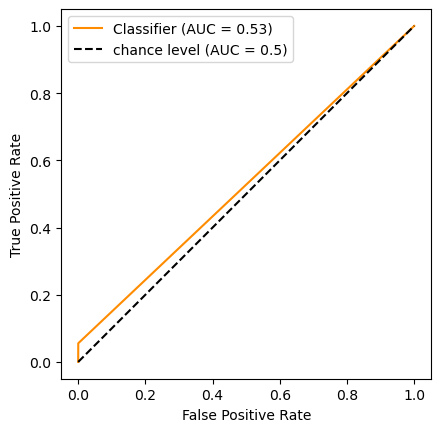

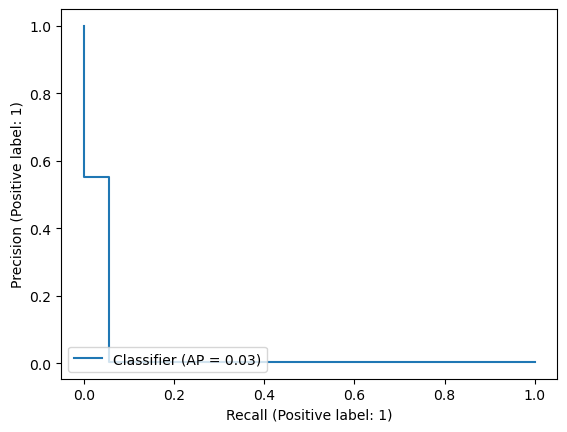

CPU times: user 10min 17s, sys: 4.71 s, total: 10min 22s
Wall time: 1min 39s


In [679]:
%%time

model = RandomForestClassifier(random_state=4,verbose=5,n_jobs=-1)
model.fit(X_train_finalnew, y_train_new1)
predicted = model.predict(X_test_finalnew)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)

Iteration 1, loss = 0.40090542
Iteration 2, loss = 0.27687516
Iteration 3, loss = 0.27099206
Iteration 4, loss = 0.26632137
Iteration 5, loss = 0.25174448
Iteration 6, loss = 0.24124154
Iteration 7, loss = 0.23515824
Iteration 8, loss = 0.23246222
Iteration 9, loss = 0.21538293
Iteration 10, loss = 0.19134172
Iteration 11, loss = 0.16871304
Iteration 12, loss = 0.15300188
Iteration 13, loss = 0.13552453
Iteration 14, loss = 0.13522937
Iteration 15, loss = 0.09189672
Iteration 16, loss = 0.04294018
Iteration 17, loss = 0.03092405
Iteration 18, loss = 0.03027223
Iteration 19, loss = 0.02949220
Iteration 20, loss = 0.02962923
Iteration 21, loss = 0.02918391
Iteration 22, loss = 0.02972822
Iteration 23, loss = 0.02898648
Iteration 24, loss = 0.02923584
Iteration 25, loss = 0.02905247
Iteration 26, loss = 0.02867835
Iteration 27, loss = 0.02883860
Iteration 28, loss = 0.02919246
Iteration 29, loss = 0.02965942
Iteration 30, loss = 0.02889174
Iteration 31, loss = 0.02860817
Iteration 32, los

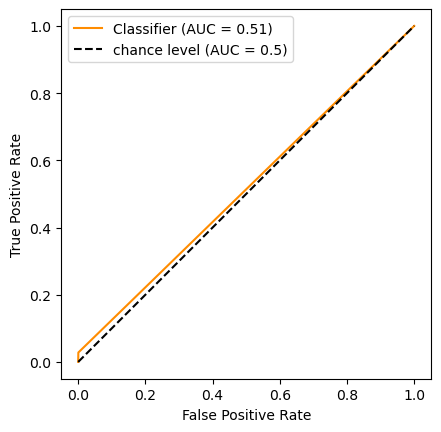

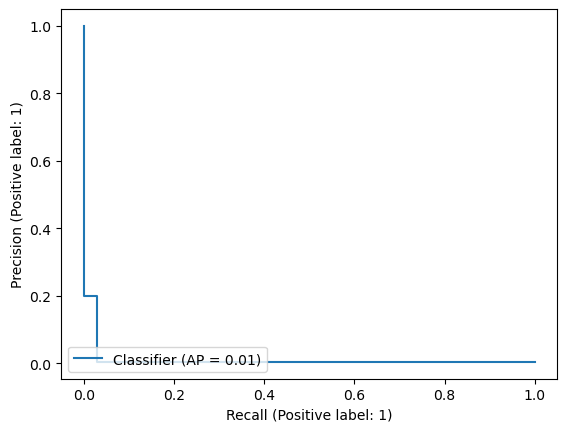

CPU times: user 23min 30s, sys: 24.1 s, total: 23min 55s
Wall time: 6min 9s


In [680]:
%%time

# Model
model = MLPClassifier(random_state=7,verbose=True)
model.fit(X_train_finalnew, y_train_new1)
predicted = model.predict(X_test_finalnew)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)

In [685]:
# Further splitting onehotencoded X_train and y_train into a validation set

X_train_fs, X_valid_fs, y_train_fs, y_valid_fs = train_test_split(X_train_wow_new, y_train_new, shuffle=True, stratify=y_train_new, random_state=42, train_size=0.8, test_size=0.2)
print(f'{X_train_fs.info()}')
print(f'{X_valid_fs.info()}')
print(f'{y_train_fs.shape}')
print(f'{y_valid_fs.shape}')
X_train_fs.head(10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1037340 entries, 509059 to 33493
Data columns (total 17 columns):
 #   Column              Non-Null Count    Dtype   
---  ------              --------------    -----   
 0   credit_card_number  1037340 non-null  category
 1   merchant            1037340 non-null  category
 2   category            1037340 non-null  category
 3   amount(usd)         1037340 non-null  float64 
 4   gender_1            1037340 non-null  int64   
 5   gender_2            1037340 non-null  int64   
 6   city                1037340 non-null  category
 7   state               1037340 non-null  category
 8   zip_code            1037340 non-null  category
 9   city_population     1037340 non-null  int64   
 10  job                 1037340 non-null  category
 11  hour_of_day_cat     1037340 non-null  category
 12  month_cat           1037340 non-null  category
 13  velocity            1037340 non-null  float64 
 14  age                 1037340 non-null  int64   


,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name
509059,639023984367,"fraud_Stokes, Christiansen and Sipes",grocery_net,51.71,1,0,Hannawa Falls,NY,13647,69,Chief Executive Officer,D,H,8539.0,28,19.717008,DestinyLowe
395295,373905417449658,fraud_Effertz LLC,entertainment,13.78,1,0,Meridian,TX,76665,2526,Phytotherapist,T,F,4981.0,49,46.416825,SarahBishop
536531,3553629419254918,fraud_Kris-Padberg,shopping_pos,961.26,1,0,Conway,WA,98238,85,"Research officer, political party",O,H,2069.0,35,55.261368,SharonJohnson
271001,371034293500716,fraud_Ratke and Sons,health_fitness,43.68,0,1,Vinton,CA,96135,128,Education administrator,V,E,64424.0,53,36.902279,JeremyJones
532788,4335531783520911,fraud_Upton PLC,entertainment,33.08,1,0,Owensville,MO,65066,6703,Naval architect,O,H,14217.0,21,70.536310,AmyDaugherty
1275175,4306630852918,fraud_Schaefer Ltd,kids_pets,199.99,1,0,Saint Louis,MO,63131,927396,Occupational hygienist,W,F,146368.0,60,24.648946,MaureenGarza
1117784,6011366578560244,fraud_Williamson LLC,misc_pos,5.41,0,1,Mc Veytown,PA,17051,4653,Nutritional therapist,M,D,21289.0,23,44.055941,AdamStark
429225,30428204673351,fraud_Bogisich-Weimann,kids_pets,58.08,0,1,Schaefferstown,PA,17088,823,Gaffer,S,G,27699.0,37,77.252598,GregVillarreal
739916,213161869125933,fraud_Dickinson Ltd,personal_care,23.70,1,0,East Andover,ME,4226,190,Animal nutritionist,X,K,46988.0,49,64.946323,MonicaLane
93872,30026790933302,fraud_Strosin-Cruickshank,grocery_pos,104.69,0,1,Mayersville,MS,39113,595,Technical brewer,F,B,8839.0,40,64.760676,JohnPeters


In [686]:
%%time

# First hot encoding, then
# Target encoding the categorical variables using a stratified k-fold nested cross-validation approach to reduce overfitting

HNTE_encoder = NestedCVWrapper((TargetEncoder)(min_samples_leaf=20, smoothing=10),cv=5,random_state=21)
X_train_fs1, X_valid_fs1, X_test_fs1 = HNTE_encoder.fit_transform(X_train_fs, y_train_fs, X_test=(X_valid_fs, X_test_wow_new))
print(X_train_fs1.info())
X_train_fs1.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1037340 entries, 0 to 1037339
Data columns (total 17 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   credit_card_number  1037340 non-null  float64
 1   merchant            1037340 non-null  float64
 2   category            1037340 non-null  float64
 3   amount(usd)         1037340 non-null  float64
 4   gender_1            1037340 non-null  float64
 5   gender_2            1037340 non-null  float64
 6   city                1037340 non-null  float64
 7   state               1037340 non-null  float64
 8   zip_code            1037340 non-null  float64
 9   city_population     1037340 non-null  float64
 10  job                 1037340 non-null  float64
 11  hour_of_day_cat     1037340 non-null  float64
 12  month_cat           1037340 non-null  float64
 13  velocity            1037340 non-null  float64
 14  age                 1037340 non-null  float64
 15  distance_from_h

,credit_card_number,merchant,category,amount(usd),gender_1,gender_2,city,state,zip_code,city_population,job,hour_of_day_cat,month_cat,velocity,age,distance_from_home,full_name
0,6.035003e-03,0.000000,0.003066,51.71,1.0,0.0,6.035003e-03,0.006571,6.035003e-03,69.0,0.003737,0.014019,0.004283,8539.0,28.0,19.717008,6.035003e-03
1,4.273504e-03,0.003540,0.002512,13.78,1.0,0.0,2.134797e-03,0.005144,4.273504e-03,2526.0,0.008109,0.001098,0.004548,4981.0,49.0,46.416825,4.273504e-03
2,3.028773e-03,0.006770,0.007331,961.26,1.0,0.0,4.399323e-03,0.004956,3.028773e-03,85.0,0.006496,0.001545,0.004184,2069.0,35.0,55.261368,3.028773e-03
3,1.032448e-02,0.003640,0.001670,43.68,0.0,1.0,1.032448e-02,0.005687,1.032448e-02,128.0,0.010324,0.001142,0.006454,64424.0,53.0,36.902279,1.032448e-02
4,1.987200e-15,0.002571,0.002505,33.08,1.0,0.0,1.987200e-15,0.004614,1.987200e-15,6703.0,0.005542,0.001545,0.004184,14217.0,21.0,70.536310,1.987200e-15
5,7.704160e-03,0.002062,0.002053,199.99,1.0,0.0,7.704160e-03,0.004868,7.704160e-03,927396.0,0.005058,0.028795,0.004708,146368.0,60.0,24.648946,7.704160e-03
6,7.849294e-03,0.000917,0.002877,5.41,0.0,1.0,7.849294e-03,0.005780,7.849294e-03,4653.0,0.007849,0.000959,0.005080,21289.0,23.0,44.055941,7.849294e-03
7,4.590666e-03,0.002038,0.002105,58.08,0.0,1.0,4.590666e-03,0.005372,4.590666e-03,823.0,0.003098,0.001158,0.003772,27699.0,37.0,77.252598,4.590666e-03
8,6.896552e-03,0.001874,0.002397,23.70,1.0,0.0,6.896552e-03,0.007403,6.896552e-03,190.0,0.011119,0.028112,0.005571,46988.0,49.0,64.946323,6.896552e-03
9,0.000000e+00,0.016785,0.013940,104.69,0.0,1.0,0.000000e+00,0.005023,0.000000e+00,595.0,0.002007,0.001258,0.008614,8839.0,40.0,64.760676,0.000000e+00


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   12.2s


building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52

[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  1.6min


building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100building tree 80 of 100

building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.6min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.6s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.0s finished


              precision    recall  f1-score   support

           0       1.00      1.00      1.00    553574
           1       0.58      0.06      0.11      2145

    accuracy                           1.00    555719
   macro avg       0.79      0.53      0.55    555719
weighted avg       0.99      1.00      0.99    555719

ROC AUC SCORE: 0.53


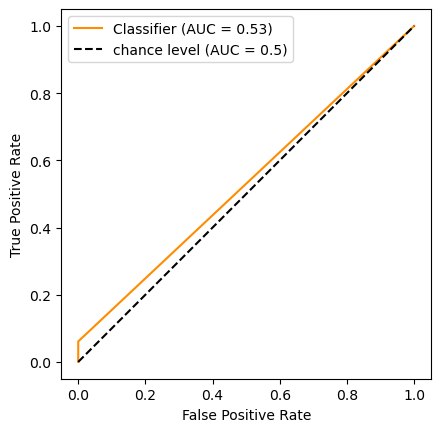

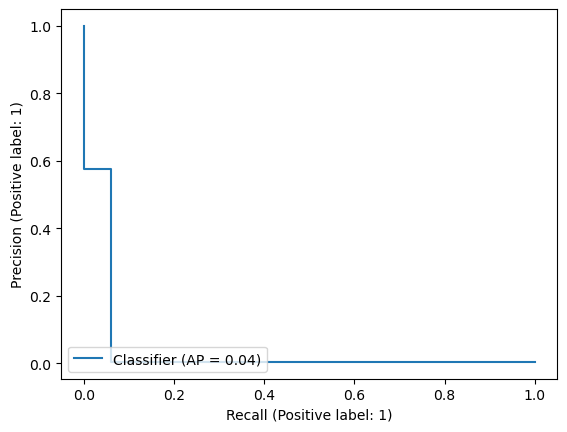

CPU times: user 16min 41s, sys: 5.29 s, total: 16min 47s
Wall time: 2min 36s


In [687]:
%%time

# Model
model = RandomForestClassifier(random_state=4,verbose=5,n_jobs=-1)
model.fit(X_train_fs1, y_train_fs)
predicted = model.predict(X_test_fs1)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)

Iteration 1, loss = 0.40083428
Iteration 2, loss = 0.29846538
Iteration 3, loss = 0.29689260
Iteration 4, loss = 0.26962561
Iteration 5, loss = 0.27297272
Iteration 6, loss = 0.26610780
Iteration 7, loss = 0.25796977
Iteration 8, loss = 0.24279179
Iteration 9, loss = 0.21757279
Iteration 10, loss = 0.19780575
Iteration 11, loss = 0.19268403
Iteration 12, loss = 0.17839267
Iteration 13, loss = 0.16535742
Iteration 14, loss = 0.14195364
Iteration 15, loss = 0.10922602
Iteration 16, loss = 0.06173177
Iteration 17, loss = 0.03203673
Iteration 18, loss = 0.03159755
Iteration 19, loss = 0.03016003
Iteration 20, loss = 0.03070621
Iteration 21, loss = 0.02991581
Iteration 22, loss = 0.03075540
Iteration 23, loss = 0.02999622
Iteration 24, loss = 0.02966468
Iteration 25, loss = 0.03065584
Iteration 26, loss = 0.02959062
Iteration 27, loss = 0.02944067
Iteration 28, loss = 0.02910602
Iteration 29, loss = 0.02921611
Iteration 30, loss = 0.02987435
Iteration 31, loss = 0.02932990
Iteration 32, los

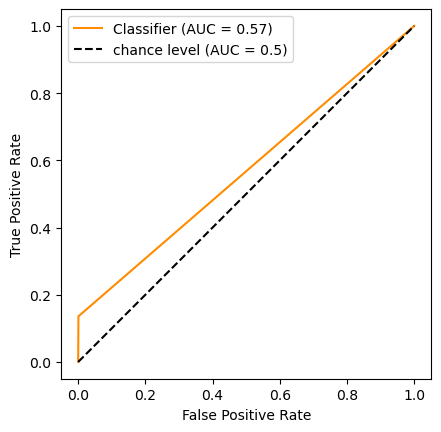

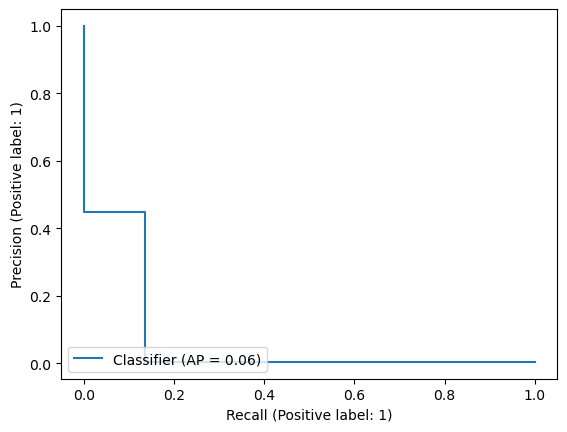

CPU times: user 32min 11s, sys: 27.1 s, total: 32min 38s
Wall time: 8min 18s


In [688]:
%%time

# Model
model = MLPClassifier(random_state=7,verbose=True)
model.fit(X_train_fs1, y_train_fs)
predicted = model.predict(X_test_fs1)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)

In [689]:
%%time

# Performing SMOTE transformation on our data
ST = SMOTE(random_state=0, n_jobs=-1)
X_train_fsSMOTE, y_train_fsSMOTE = ST.fit_resample(X_train_fs1, y_train_fs)

print("Before SMOTE:", Counter(y_train_fs))
print("After SMOTE:", Counter(y_train_fsSMOTE))

Before SMOTE: Counter({0: 1031335, 1: 6005})
After SMOTE: Counter({0: 1031335, 1: 1031335})
CPU times: user 2.52 s, sys: 1.06 s, total: 3.58 s
Wall time: 3.08 s


In [694]:
scaler = MinMaxScaler(feature_range=(0, 1), copy=True, clip=False)
X_train_fsSMOTE_rs = scaler.fit_transform(X_train_fsSMOTE)
X_train_fsSMOTE_rs

array([[0.01921855, 0.        , 0.09720389, ..., 0.17073171, 0.20859296,
        0.01921855],
       [0.01360903, 0.11642085, 0.06417621, ..., 0.42682927, 0.49165472,
        0.01360903],
       [0.00964517, 0.22267359, 0.35167273, ..., 0.25609756, 0.58542134,
        0.00964517],
       ...,
       [0.54108918, 0.22915273, 0.61765102, ..., 0.23228008, 0.55057053,
        0.54108918],
       [0.01299995, 0.48500046, 0.75128309, ..., 0.12195122, 0.49505755,
        0.01299995],
       [0.02967398, 0.22658756, 0.213634  , ..., 0.30303981, 0.70804301,
        0.02967398]])

Iteration 1, loss = 0.17566098
Iteration 2, loss = 0.11586532
Iteration 3, loss = 0.09745966
Iteration 4, loss = 0.08828012
Iteration 5, loss = 0.08332726
Iteration 6, loss = 0.08040536
Iteration 7, loss = 0.07863203
Iteration 8, loss = 0.07738537
Iteration 9, loss = 0.07653662
Iteration 10, loss = 0.07539752
Iteration 11, loss = 0.07454497
Iteration 12, loss = 0.07385011
Iteration 13, loss = 0.07335062
Iteration 14, loss = 0.07281066
Iteration 15, loss = 0.07239154
Iteration 16, loss = 0.07199894
Iteration 17, loss = 0.07156632
Iteration 18, loss = 0.07132199
Iteration 19, loss = 0.07104942
Iteration 20, loss = 0.07078100
Iteration 21, loss = 0.07065754
Iteration 22, loss = 0.07040077
Iteration 23, loss = 0.07024004
Iteration 24, loss = 0.07009846
Iteration 25, loss = 0.06995760
Iteration 26, loss = 0.06981752
Iteration 27, loss = 0.06973849
Iteration 28, loss = 0.06962103
Iteration 29, loss = 0.06951788
Iteration 30, loss = 0.06943147
Iteration 31, loss = 0.06932903
Iteration 32, los

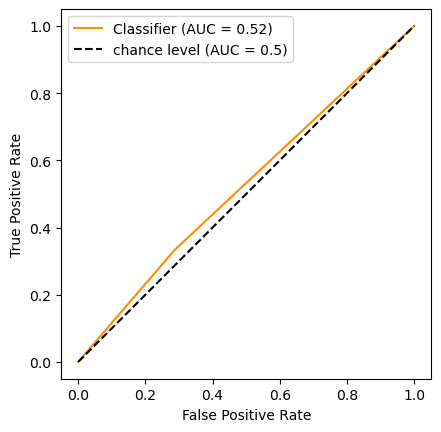

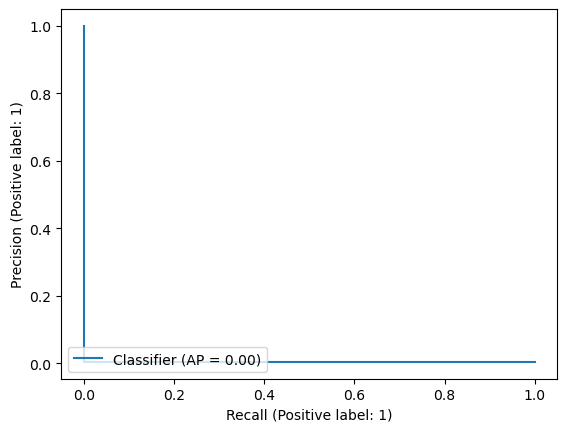

CPU times: user 2h 53min 32s, sys: 2min 16s, total: 2h 55min 48s
Wall time: 44min 35s


In [704]:
%%time

# Model
model = MLPClassifier(random_state=7,verbose=True)
model.fit(X_train_fsSMOTE_rs, y_train_fsSMOTE)
predicted = model.predict(X_test_fs1_rs)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 100building tree 2 of 100

building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   24.2s


building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52

[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  3.2min


building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  5.6min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.1s finished


              precision    recall  f1-score   support

           0       0.99      0.60      0.74    553574
           1       0.00      0.08      0.00      2145

    accuracy                           0.59    555719
   macro avg       0.50      0.34      0.37    555719
weighted avg       0.99      0.59      0.74    555719

ROC AUC SCORE: 0.34


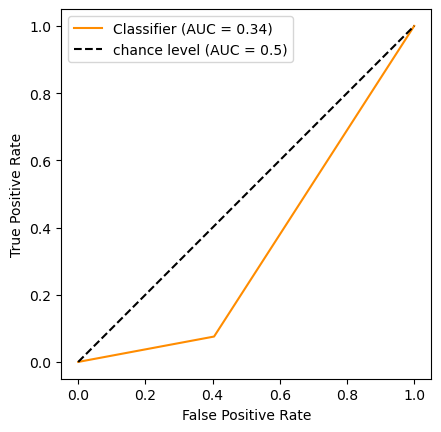

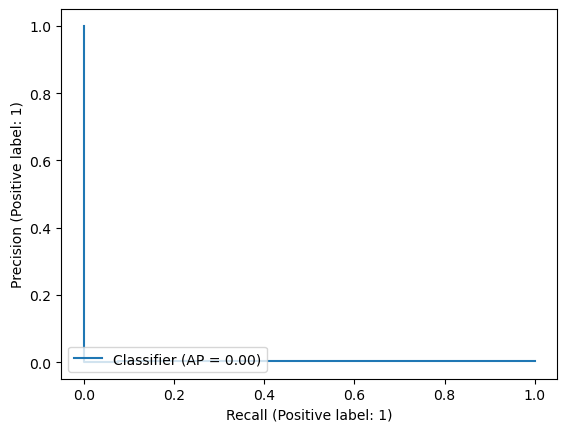

CPU times: user 36min 19s, sys: 15.1 s, total: 36min 34s
Wall time: 5min 42s


In [703]:
%%time

# Model
model = RandomForestClassifier(random_state=4,verbose=5,n_jobs=-1)
model.fit(X_train_fsSMOTE_rs, y_train_fsSMOTE)
predicted = model.predict(X_test_fs1_rs)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)

In [697]:
scaler = MinMaxScaler(feature_range=(0, 1), copy=True, clip=False)
X_train_fs1_rs = scaler.fit_transform(X_train_fs1)
X_train_fs1_rs

array([[0.01921855, 0.        , 0.09720389, ..., 0.17073171, 0.20859296,
        0.01921855],
       [0.01360903, 0.11642085, 0.06417621, ..., 0.42682927, 0.49165472,
        0.01360903],
       [0.00964517, 0.22267359, 0.35167273, ..., 0.25609756, 0.58542134,
        0.00964517],
       ...,
       [0.01922725, 0.02949676, 0.        , ..., 0.41463415, 0.45609056,
        0.01922725],
       [0.00476011, 0.02355938, 0.03675986, ..., 0.14634146, 0.51054906,
        0.00476011],
       [0.        , 0.05369615, 0.06504343, ..., 0.34146341, 0.56513025,
        0.        ]])

In [700]:
scaler = MinMaxScaler(feature_range=(0, 1), copy=True, clip=False)
X_test_fs1_rs = scaler.fit_transform(X_test_fs1)
X_test_fs1_rs

array([[0.16651786, 0.04969093, 0.05973235, ..., 0.45679012, 0.1626678 ,
        0.16651786],
       [0.14401544, 0.10076602, 0.05973235, ..., 0.18518519, 0.69551755,
        0.14401544],
       [0.09106445, 0.05261818, 0.0055082 , ..., 0.43209877, 0.39243299,
        0.09106445],
       ...,
       [0.05108889, 0.04028396, 0.02946291, ..., 0.2962963 , 0.53645876,
        0.05108889],
       [0.16315283, 0.11287051, 0.09353407, ..., 0.49382716, 0.35162308,
        0.16315283],
       [0.        , 0.14441118, 0.06066781, ..., 0.14814815, 0.47995363,
        0.        ]])

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   12.6s


building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54

[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  1.6min


building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.6min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.9s finished


              precision    recall  f1-score   support

           0       1.00      0.91      0.95    553574
           1       0.00      0.06      0.01      2145

    accuracy                           0.91    555719
   macro avg       0.50      0.49      0.48    555719
weighted avg       0.99      0.91      0.95    555719

ROC AUC SCORE: 0.49


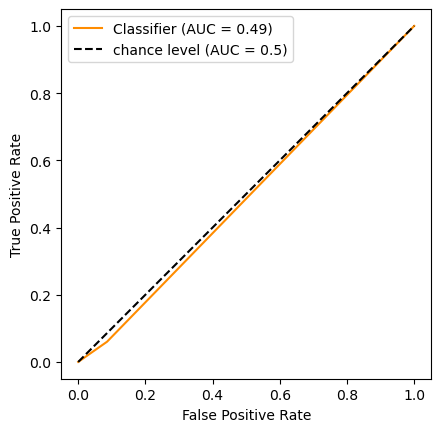

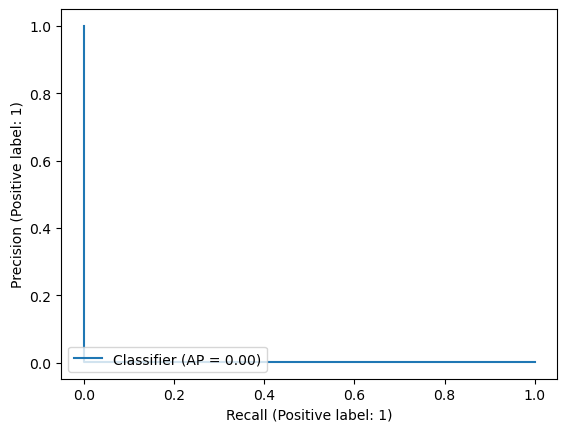

CPU times: user 16min 45s, sys: 5.75 s, total: 16min 51s
Wall time: 2min 39s


In [701]:
%%time

# Model
model = RandomForestClassifier(random_state=4,verbose=5,n_jobs=-1)
model.fit(X_train_fs1_rs, y_train_fs)
predicted = model.predict(X_test_fs1_rs)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)

Iteration 1, loss = 0.02998318
Iteration 2, loss = 0.02021468
Iteration 3, loss = 0.01773480
Iteration 4, loss = 0.01663854
Iteration 5, loss = 0.01585931
Iteration 6, loss = 0.01530474
Iteration 7, loss = 0.01486552
Iteration 8, loss = 0.01452611
Iteration 9, loss = 0.01423970
Iteration 10, loss = 0.01405507
Iteration 11, loss = 0.01392271
Iteration 12, loss = 0.01380802
Iteration 13, loss = 0.01369907
Iteration 14, loss = 0.01363950
Iteration 15, loss = 0.01359170
Iteration 16, loss = 0.01355400
Iteration 17, loss = 0.01355937
Iteration 18, loss = 0.01350520
Iteration 19, loss = 0.01343625
Iteration 20, loss = 0.01341696
Iteration 21, loss = 0.01338520
Iteration 22, loss = 0.01339552
Iteration 23, loss = 0.01337187
Iteration 24, loss = 0.01332267
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
              precision    recall  f1-score   support

           0       1.00      0.93      0.96    553574
           1       0.01      0.24      0.0

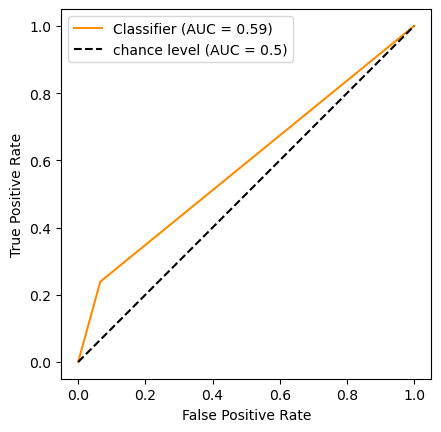

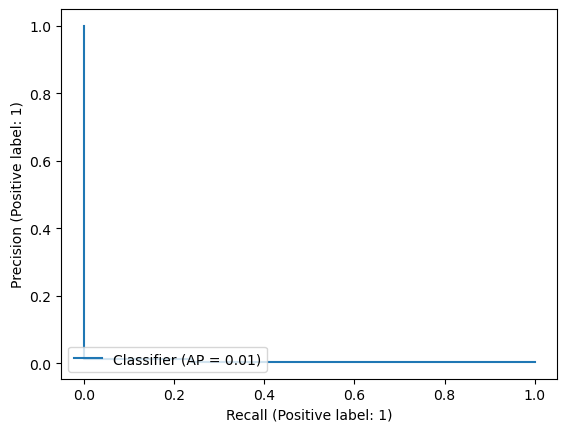

CPU times: user 11min 22s, sys: 9.16 s, total: 11min 31s
Wall time: 2min 56s


In [702]:
%%time

# Model
model = MLPClassifier(random_state=7,verbose=True)
model.fit(X_train_fs1_rs, y_train_fs)
predicted = model.predict(X_test_fs1_rs)
print(classification_report(y_test_new, predicted))
performance(y_test_new, predicted)